In [2]:
suppressMessages(suppressWarnings(library(Seurat)))
suppressMessages(suppressWarnings(library(stringr)))
suppressMessages(suppressWarnings(library(dplyr)))

In [2]:
dataobj <- readRDS("/data1/chenyx/Compitition/heart_heart_HCLAdultHeart1.seuratobj.rds")

In [5]:
dataobj

An object of class Seurat 
43878 features across 1308 samples within 1 assay 
Active assay: RNA (43878 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

# dimension reduction

PC_ 1 
Positive:  FTL, FTH1, TYROBP, CD74, TMSB4X, CTSS, FCER1G, CTSB, C1QB, GPR183 
	   SOD2, C5AR1, PLAUR, LYZ, CXCL3, CD83, CXCL8, IL1B, CCL3L3, BCL2A1 
	   SRGN, CCL3, C1QA, NPC2, AIF1, IER3, NFKBIA, SCGB1D1, S100A4, CXCL2 
Negative:  SPARCL1, IGFBP7, ADIRF, TAGLN, ACTA2, MYL9, DSTN, TPM2, MGST3, MGP 
	   PLN, CAV1, MT2A, NDUFA4L2, MYL6, DCN, RGS16, TIMP3, CSRP2, RERGL 
	   PLA2G2A, PPP1R14A, CLU, RGS5, COX7A1, APOD, SELENOW, MYH11, MT1E, CRYAB 
PC_ 2 
Positive:  ACTA2, TAGLN, TPM2, MYL6, MT-CO1, MYL9, RERGL, ADIRF, DSTN, MT-CO3 
	   MYH11, PLN, PPP1R14A, SELENOW, CSRP2, MT2A, ATP1A2, SNCG, CNN1, PPP1R15A 
	   NDUFA4, MGST3, MT1M, MTATP6P1, MT-CYB, MT-ATP6, KCNMB1, MT1X, NDUFA4L2, CYCS 
Negative:  DCN, APOD, MGP, LUM, EFEMP1, C1R, MGST1, MFAP4, ADH1B, C1S 
	   FBLN1, SERPINF1, C3, CFD, NEGR1, FBLN2, PCOLCE2, GPX3, MFAP5, DPT 
	   LAMA2, GSN, SERPING1, VCAN, PRELP, CXCL12, S100A13, CDH19, CDO1, ABCA8 
PC_ 3 
Positive:  IL1B, B2M, FCN1, G0S2, BCL2A1, SRGN, CD52, PLAUR, EREG, TMSB4X 


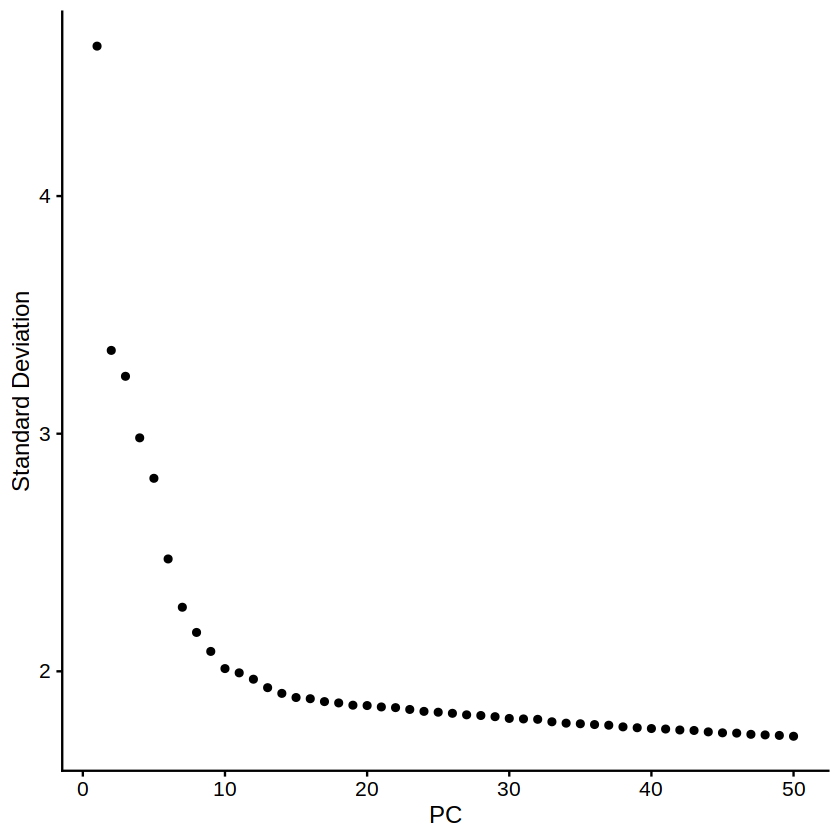

In [7]:
dataobj <- RunPCA(dataobj, features = VariableFeatures(object = dataobj))
ElbowPlot(dataobj,ndims=50) 

In [8]:
pcDim = 20

In [9]:
dataobj <- RunUMAP(dataobj, dims = 1:pcDim)
p_umap <- DimPlot(dataobj, reduction = "umap", label = TRUE, pt.size=1)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
14:57:16 UMAP embedding parameters a = 0.9922 b = 1.112

14:57:16 Read 1308 rows and found 20 numeric columns

14:57:16 Using Annoy for neighbor search, n_neighbors = 30

14:57:16 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:57:17 Writing NN index file to temp file /tmp/RtmpOBgVTD/file3ec0f17269c3a6

14:57:17 Searching Annoy index using 1 thread, search_k = 3000

14:57:17 Annoy recall = 100%

14:57:17 Commencing smooth kNN distance calibration using 1 thread

14:57:18 Initializing f

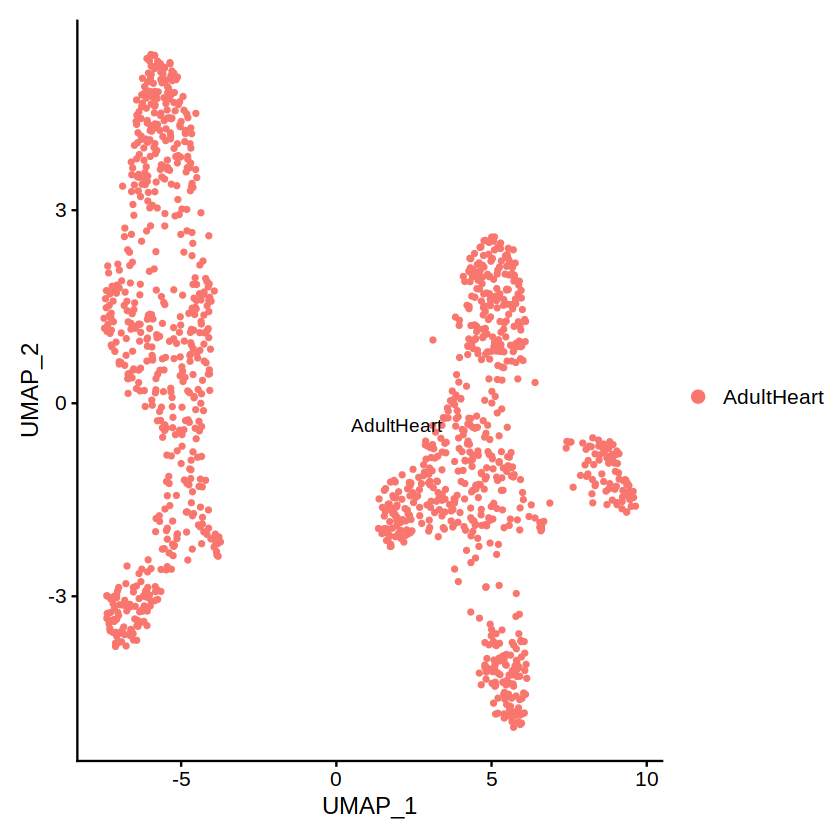

In [11]:
p_umap

# Clustering

In [18]:
# Cluster the cells
dataobj <- FindNeighbors(dataobj, reduction = "pca", dims = 1:pcDim, nn.eps = 0.5)
dataobj <- FindClusters(dataobj, resolution =1, n.start = 10)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1308
Number of edges: 59730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7771
Number of communities: 10
Elapsed time: 0 seconds


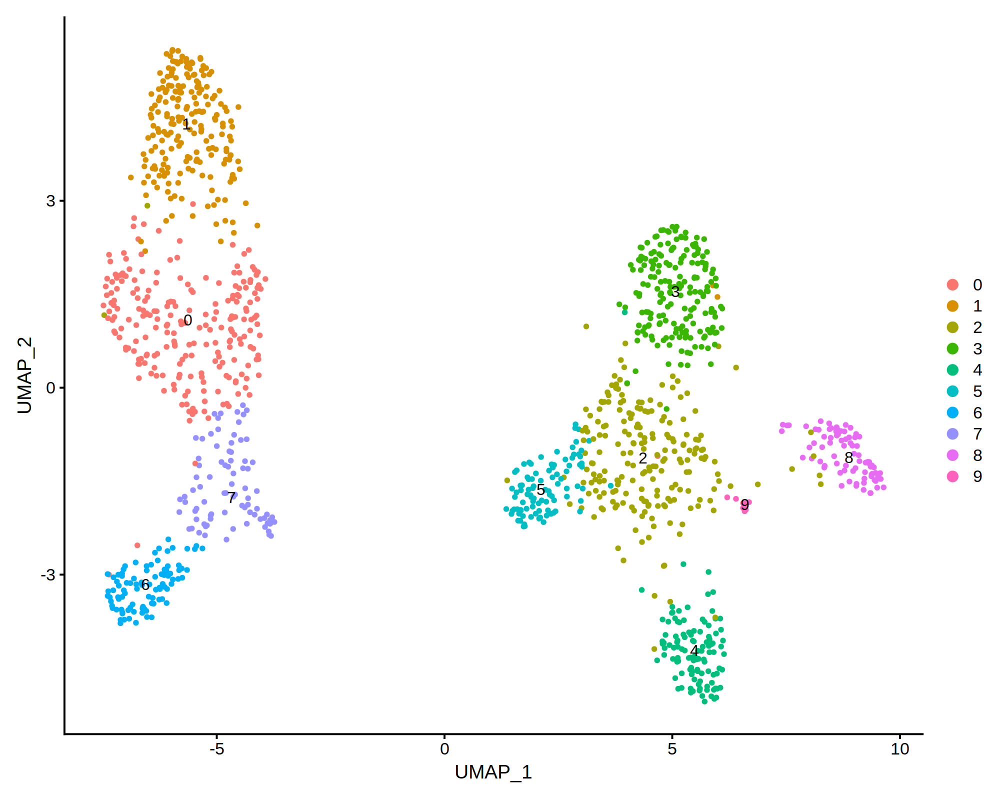

In [19]:
options(repr.plot.width=10, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",label = T)

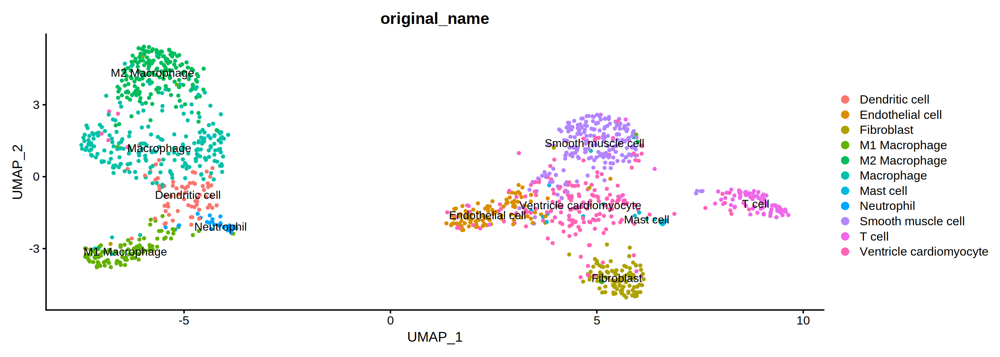

In [22]:
DimPlot(dataobj,group.by = "original_name",label = T)

# Annoation

### Fibroblast

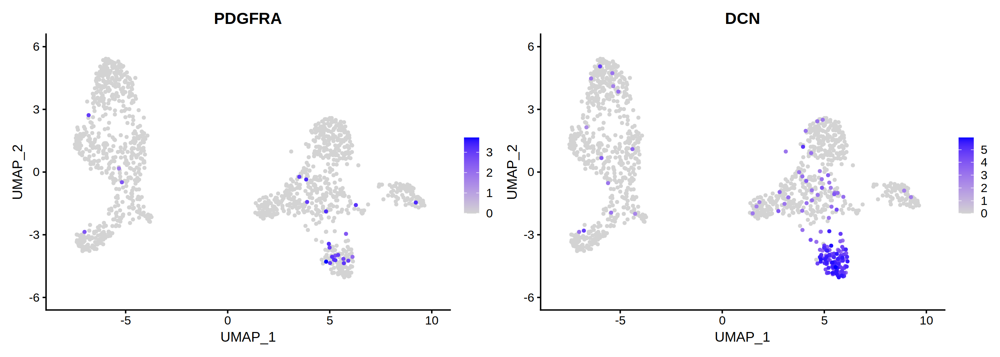

In [20]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1
FeaturePlot(dataobj,features = c("PDGFRA","DCN"),pt.size = pt.size,order = T,ncol=2)

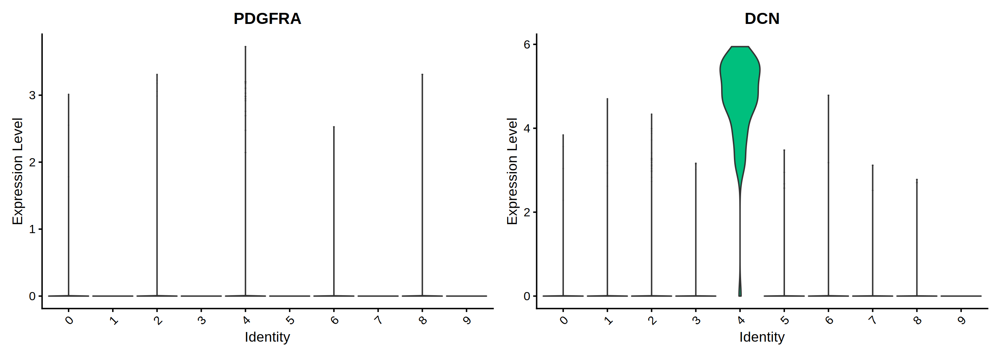

In [21]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

VlnPlot(dataobj,features = c("PDGFRA","DCN"),pt.size = 0,ncol=2)

In [23]:
dataobj <- RenameIdents(object = dataobj,'4' = 'Fibroblast')

### SMC

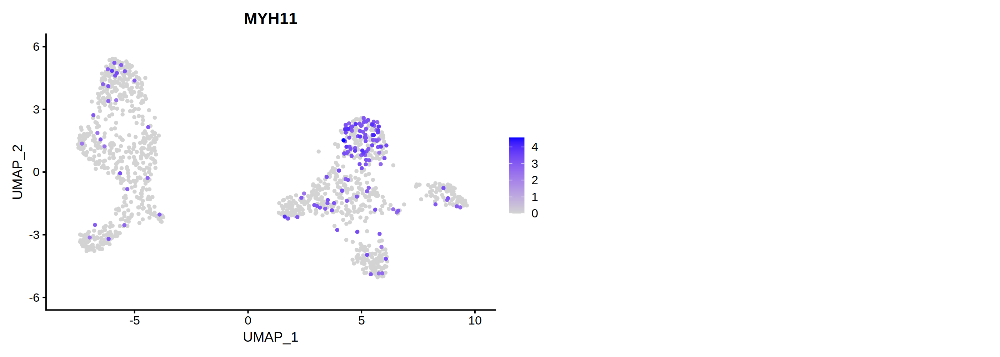

In [28]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("MYH11"),pt.size = pt.size,order = T,ncol=2)

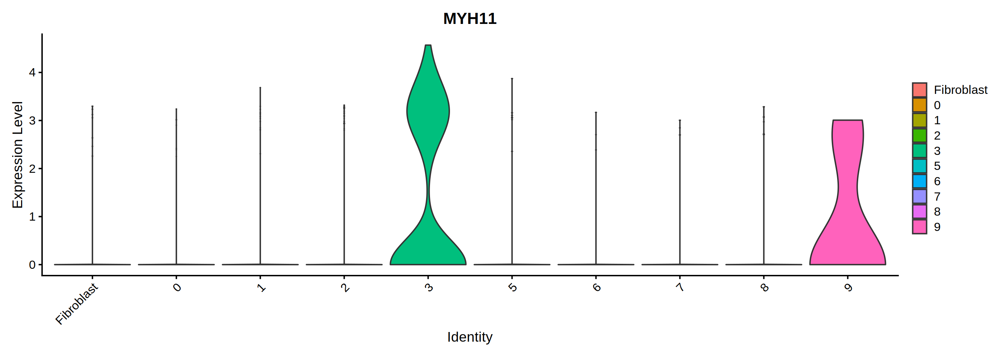

In [29]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MYH11"),pt.size = 0,ncol=1)

In [30]:
dataobj <- RenameIdents(object = dataobj,'3' = 'Smooth muscle cell')

### Pericyte

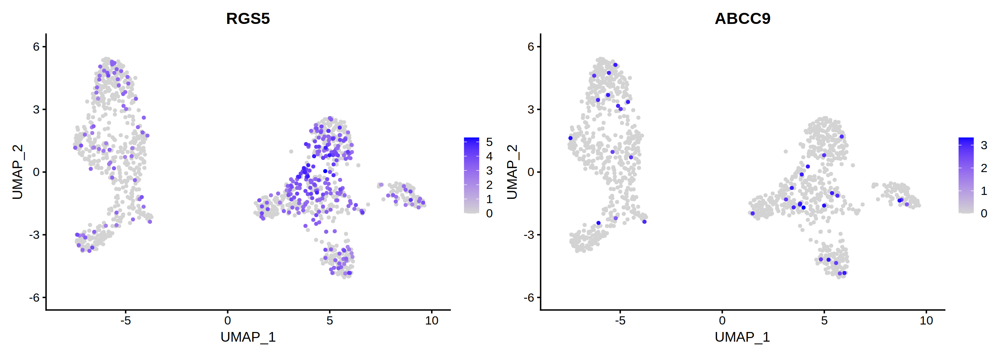

In [31]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("RGS5","ABCC9"),pt.size = pt.size,order = T,ncol=2)

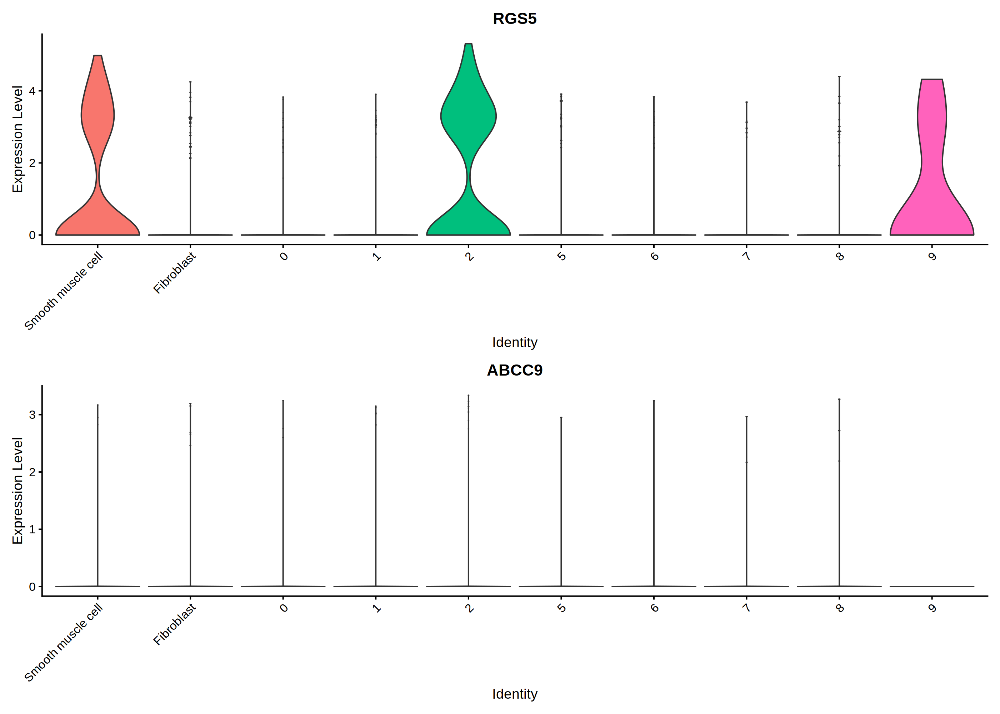

In [32]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("RGS5","ABCC9"),pt.size = 0,ncol=1)

### Mesothelial cell

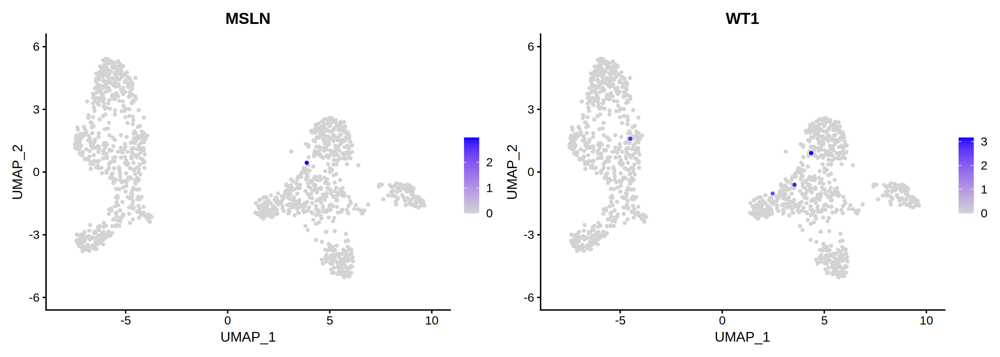

In [33]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("MSLN","WT1"),pt.size = pt.size,order = T,ncol=2)

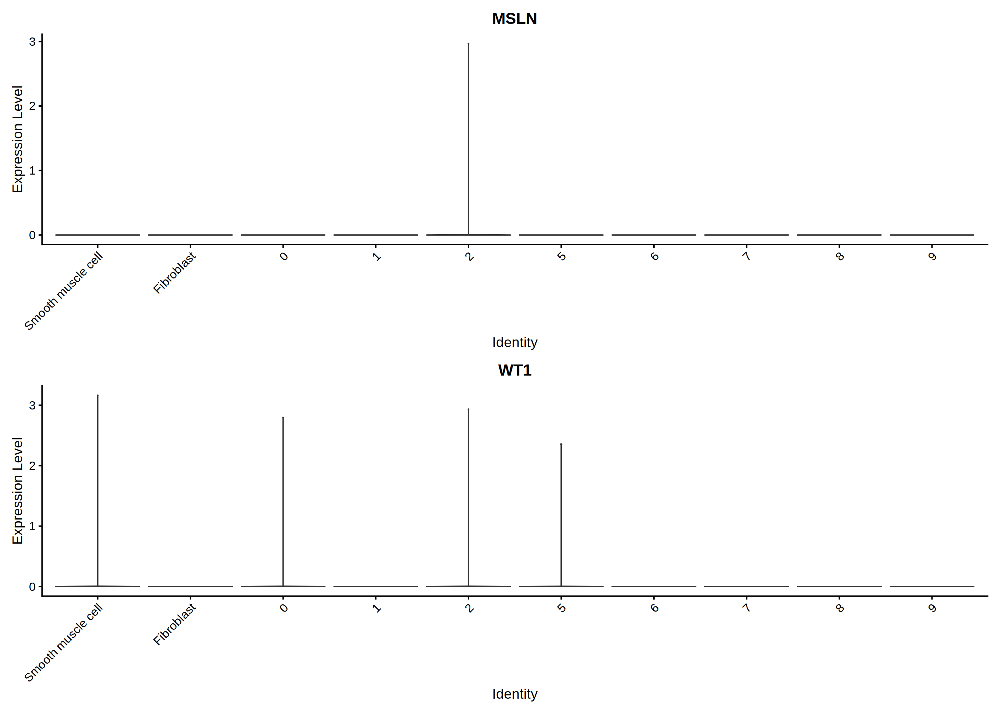

In [34]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MSLN","WT1"),pt.size = 0,ncol=1)

### Endothelial cell

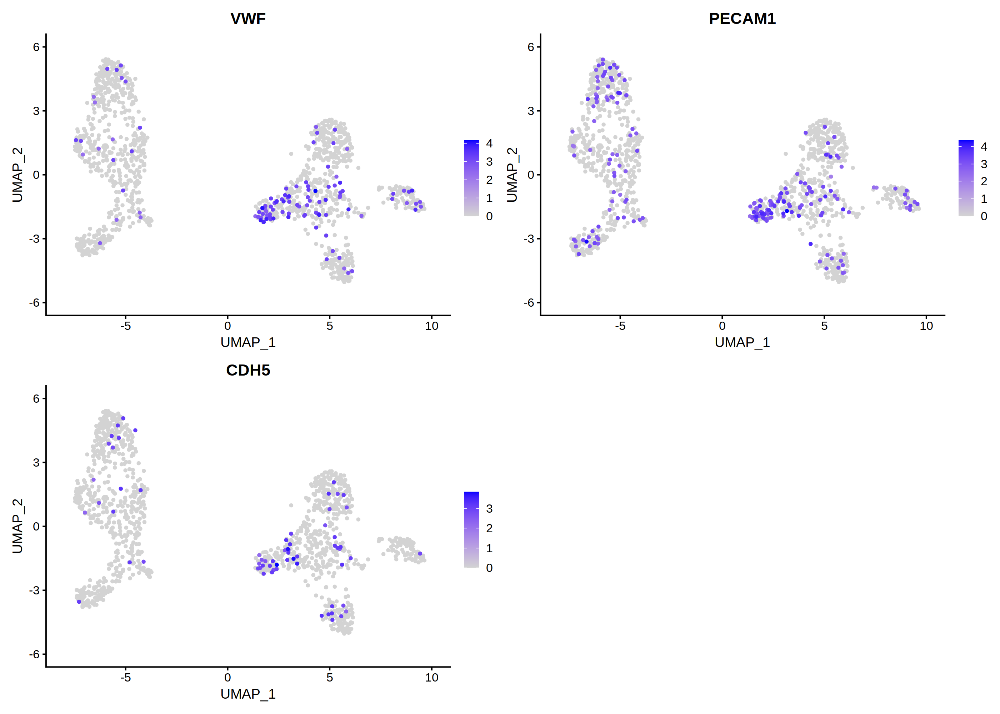

In [35]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("VWF","PECAM1","CDH5"),pt.size = pt.size,order = T,ncol=2)

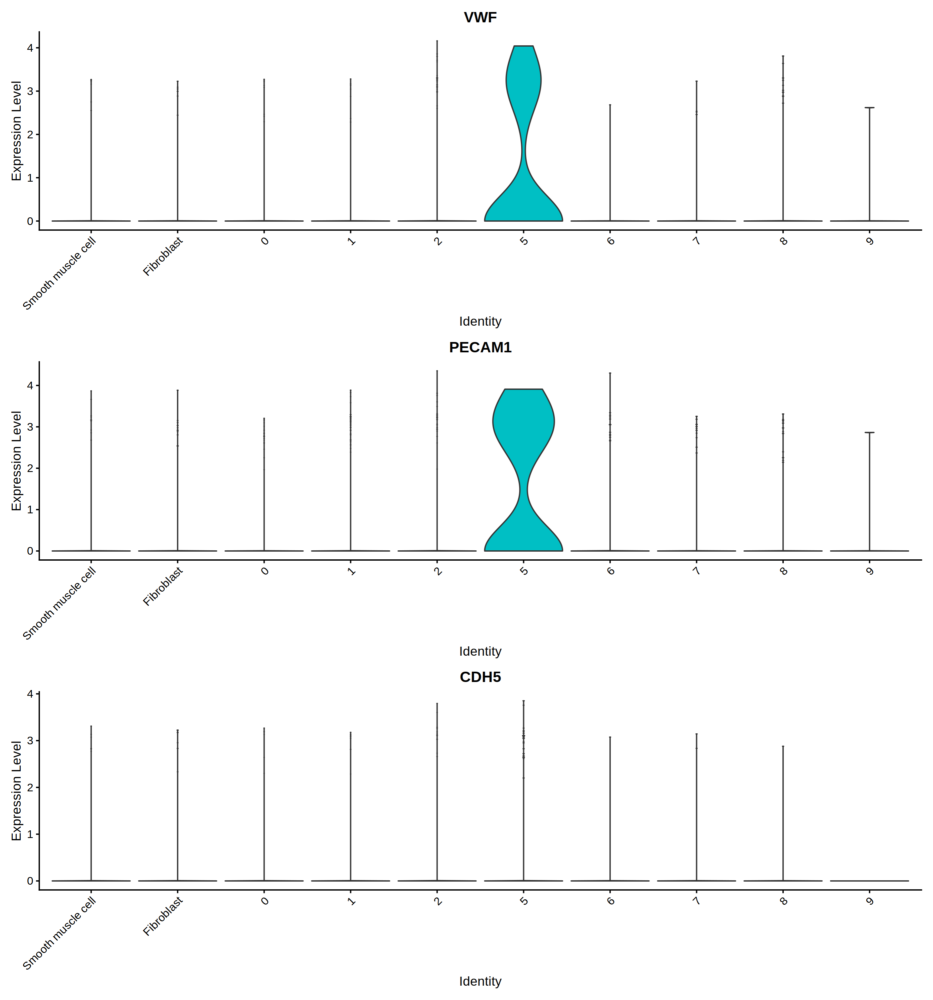

In [36]:
options(repr.plot.width=14, repr.plot.height=5*3, repr.plot.res = 200)

VlnPlot(dataobj,features = c("VWF","PECAM1","CDH5"),pt.size = 0,ncol=1)

In [37]:
dataobj <- RenameIdents(object = dataobj,'5' = 'Endothelial cell')

### Neuron

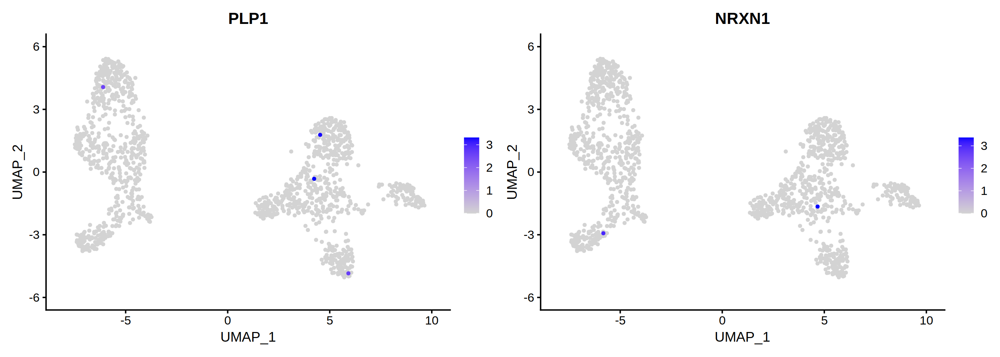

In [38]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("PLP1","NRXN1"),pt.size = pt.size,order = T,ncol=2)

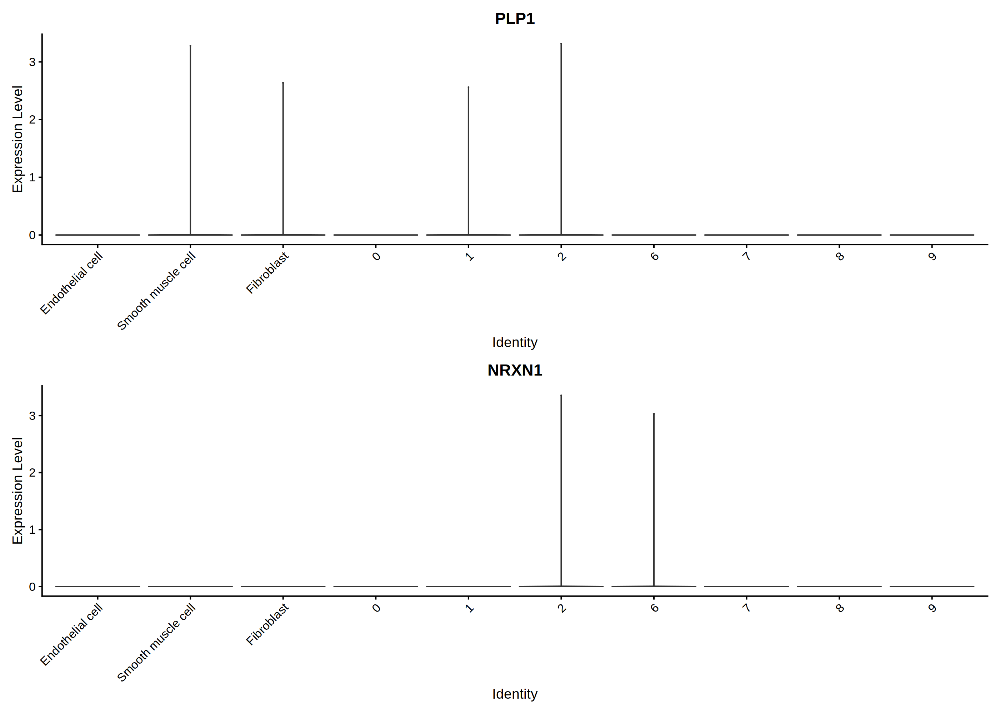

In [39]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("PLP1","NRXN1"),pt.size = 0,ncol=1)

### Neurglial cell

Warning message in FeaturePlot(dataobj, features = c("MBP", "PRX", "MPZ"), pt.size = pt.size, :
“All cells have the same value (0) of MBP.”
Warning message in FeaturePlot(dataobj, features = c("MBP", "PRX", "MPZ"), pt.size = pt.size, :
“All cells have the same value (0) of PRX.”


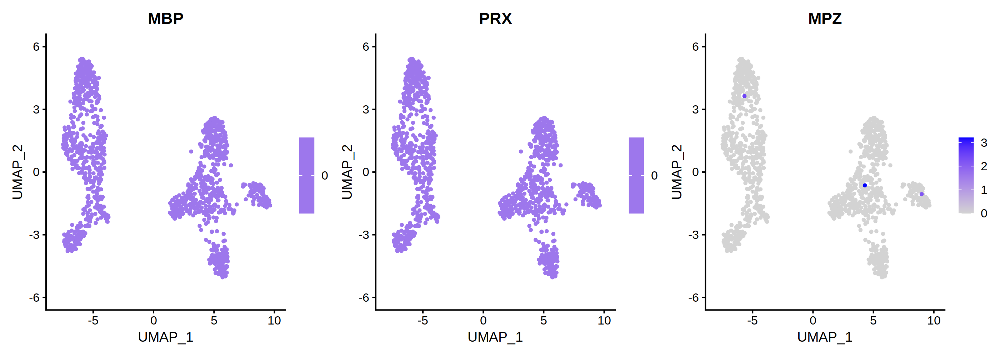

In [40]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("MBP","PRX","MPZ"),pt.size = pt.size,order = T,ncol=3)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of MBP.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of PRX.”


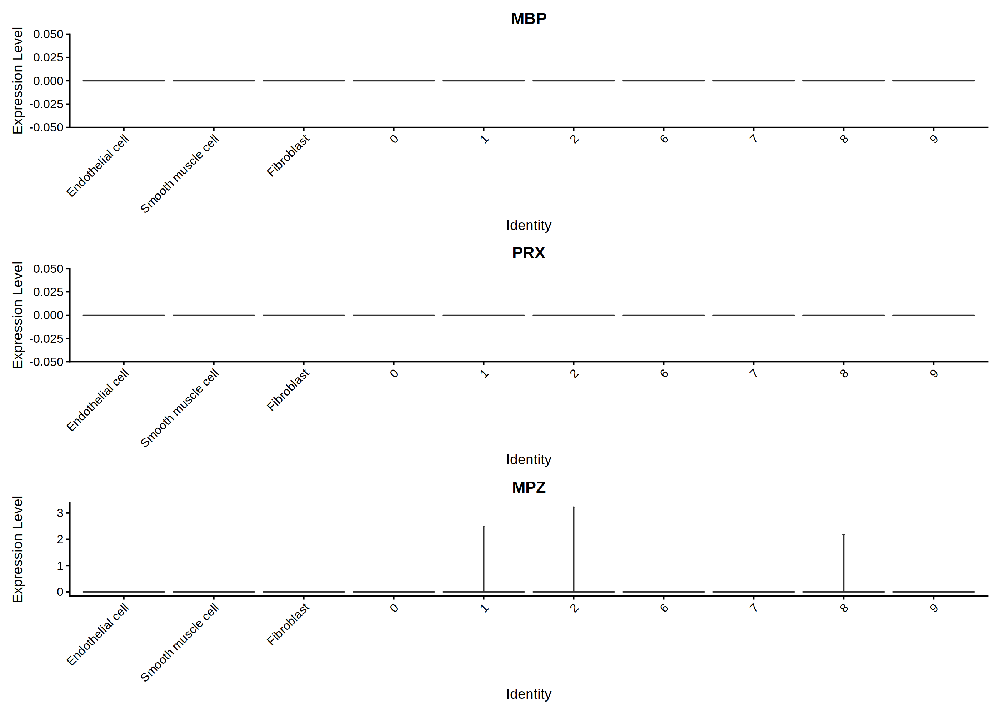

In [41]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MBP","PRX","MPZ"),pt.size = 0,ncol=1)

### Adipocyte

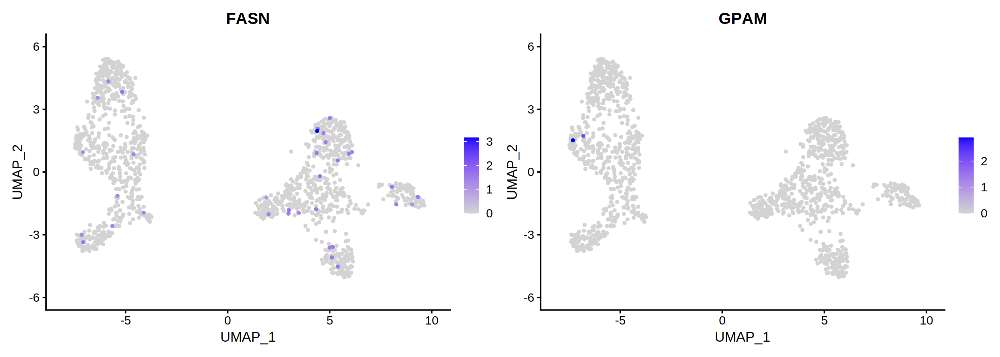

In [42]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("FASN","GPAM"),pt.size = pt.size,order = T,ncol=2)

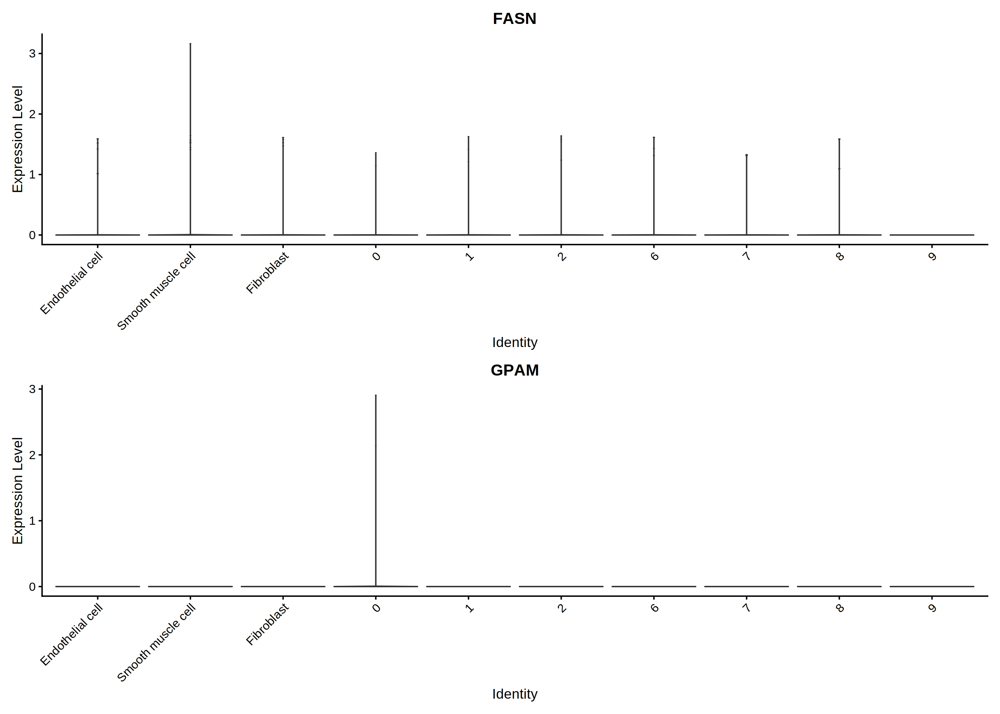

In [43]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("FASN","GPAM"),pt.size = 0,ncol=1)

### Myeloid cell

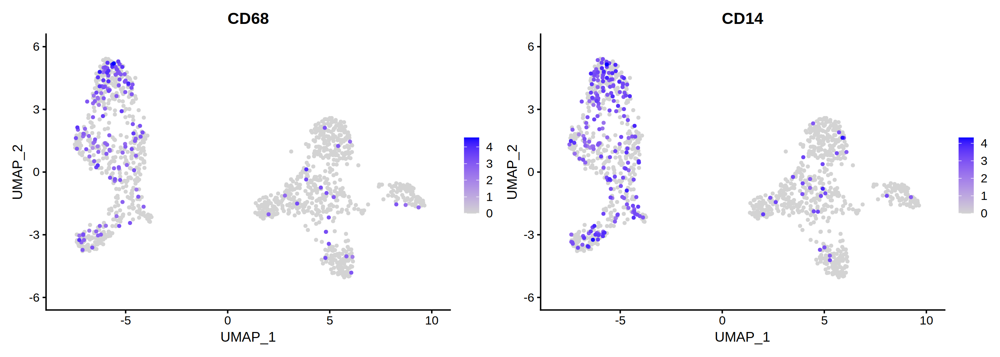

In [45]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("CD68","CD14"),pt.size = pt.size,order = T,ncol=2)

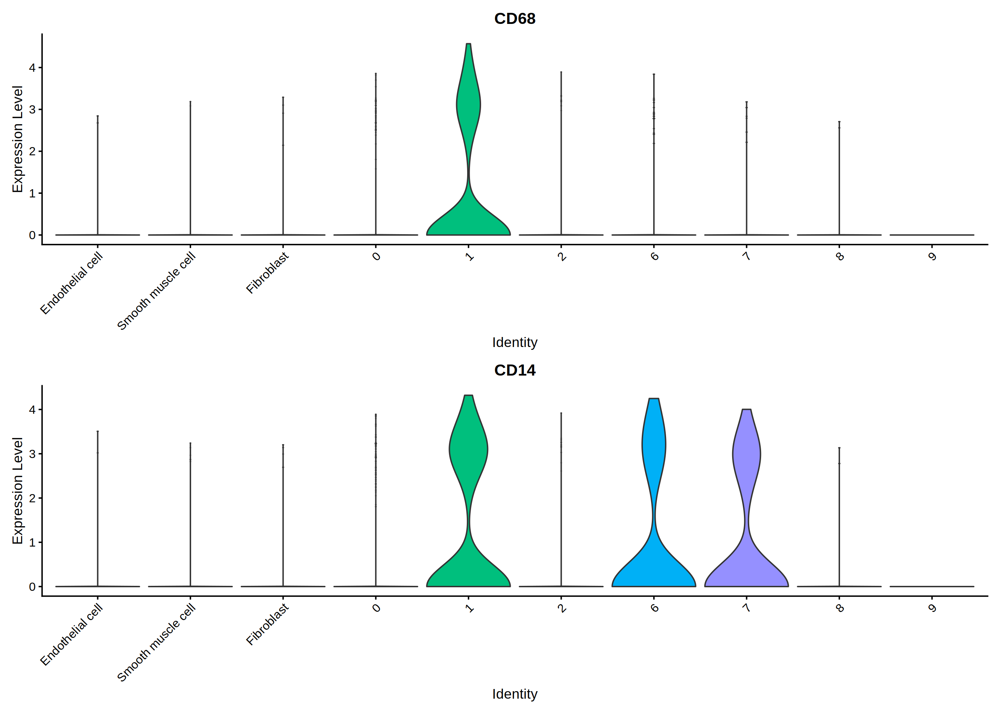

In [44]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("CD68","CD14"),pt.size = 0,ncol=1)

In [46]:
dataobj <- RenameIdents(object = dataobj,'0' = 'Myeloid cell','1' = 'Myeloid cell','6' = 'Myeloid cell','7' = 'Myeloid cell')

### Lymphoid cell

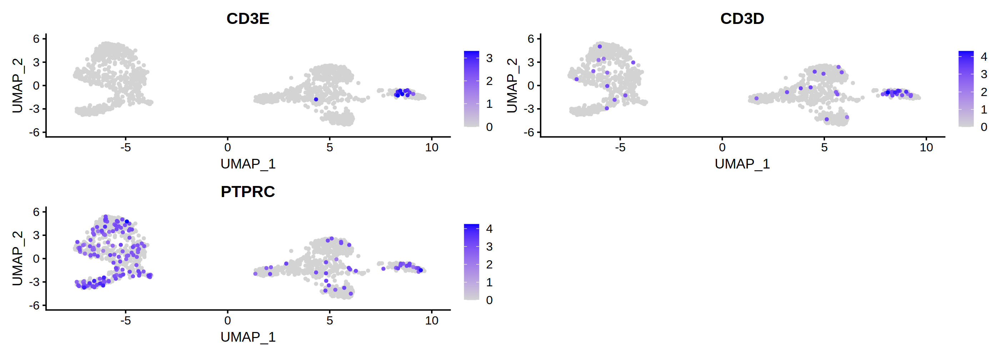

In [53]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("CD3E","CD3D","PTPRC"),pt.size = pt.size,order = T,ncol=2)

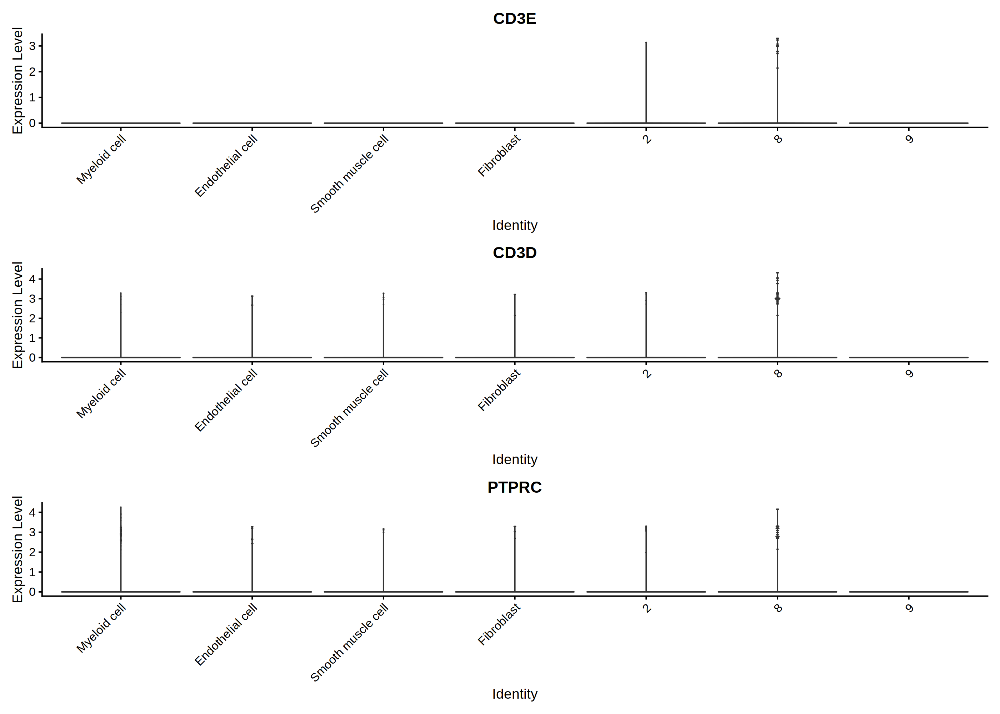

In [54]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("CD3E","CD3D","PTPRC"),pt.size = 0,ncol=1)

In [55]:
dataobj <- RenameIdents(object = dataobj,'8' = 'Lymphoid cell')

### Cardiomyocyte cell

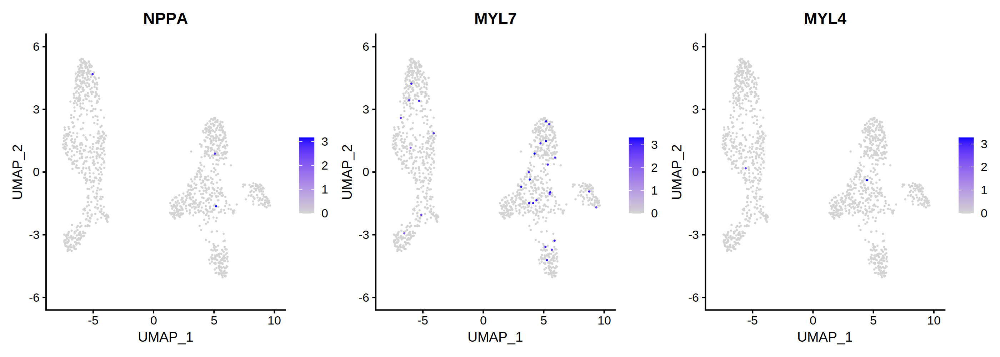

In [56]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

FeaturePlot(dataobj,features = c("NPPA","MYL7","MYL4"),pt.size = 0.1,order = T,ncol=3)

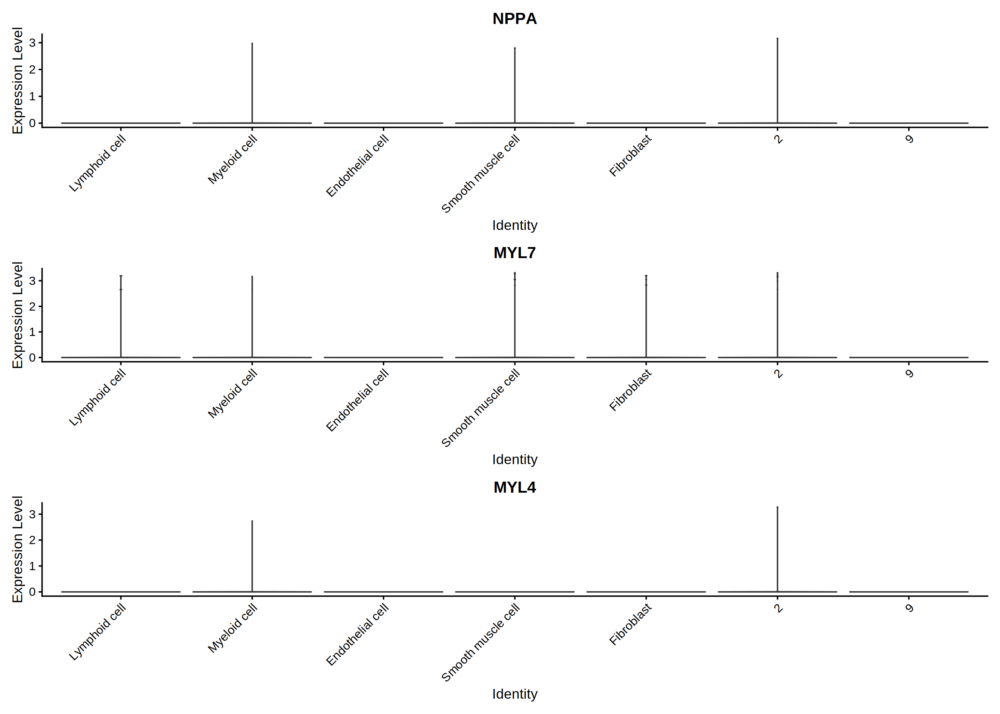

In [57]:
options(repr.plot.width=14, repr.plot.height=10, repr.plot.res = 200)

VlnPlot(dataobj,features = c("NPPA","MYL7","MYL4"),pt.size = 0,ncol=1)

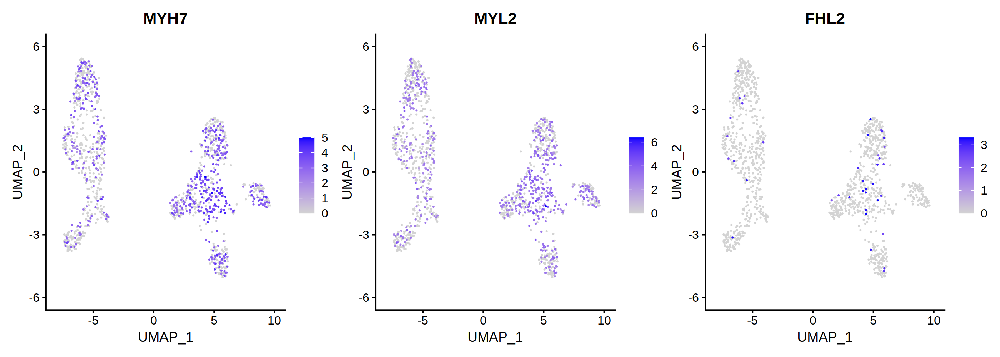

In [61]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

FeaturePlot(dataobj,features = c("MYH7","MYL2","FHL2"),pt.size = 0.1,order = T,ncol=3)

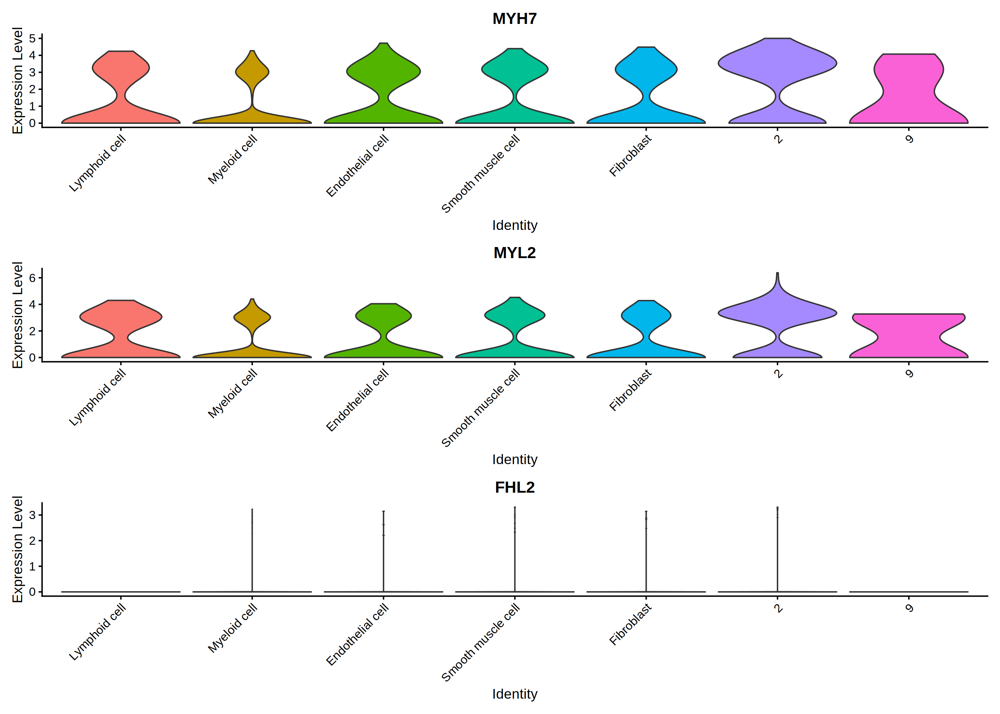

In [62]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MYH7","MYL2","FHL2"),pt.size = 0,ncol=1)

In [64]:
dataobj <- RenameIdents(object = dataobj,'2' = 'Cardiomyocyte cell')

### Mast cell

Warning message in FeaturePlot(dataobj, features = c("MS4A2", "CPA3", "TPSAB1"), :
“All cells have the same value (0) of CPA3.”


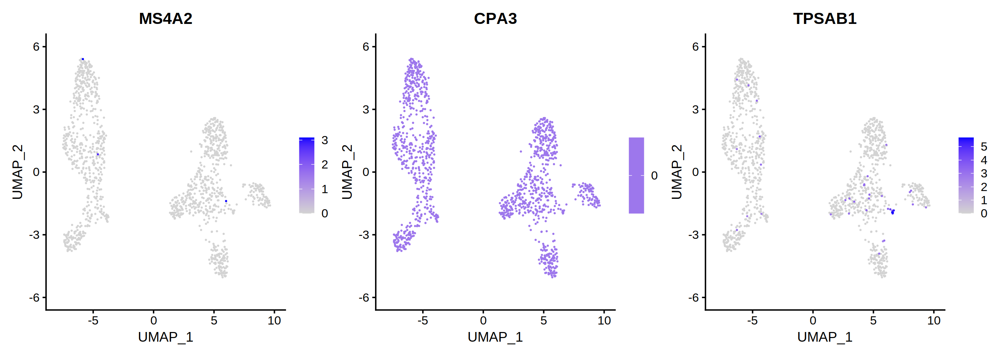

In [65]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

FeaturePlot(dataobj,features = c("MS4A2","CPA3","TPSAB1"),pt.size = 0.1,order = T,ncol=3)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of CPA3.”


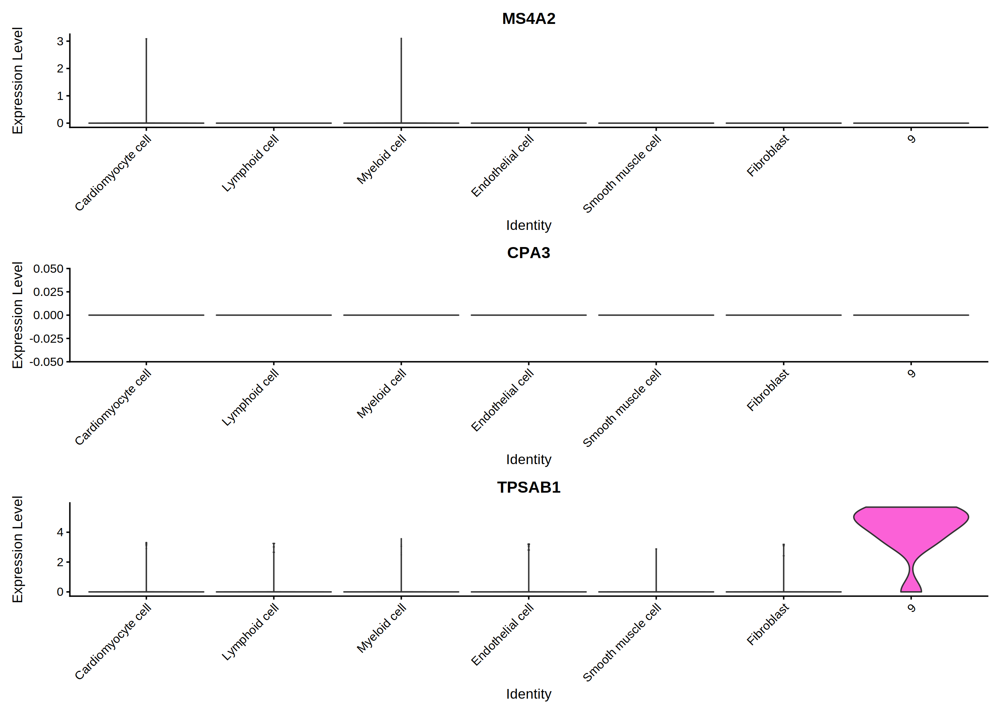

In [66]:
options(repr.plot.width=14, repr.plot.height=10, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MS4A2","CPA3","TPSAB1"),pt.size = 0,ncol=1)

In [67]:
dataobj <- RenameIdents(object = dataobj,'9' = 'Mast cell')

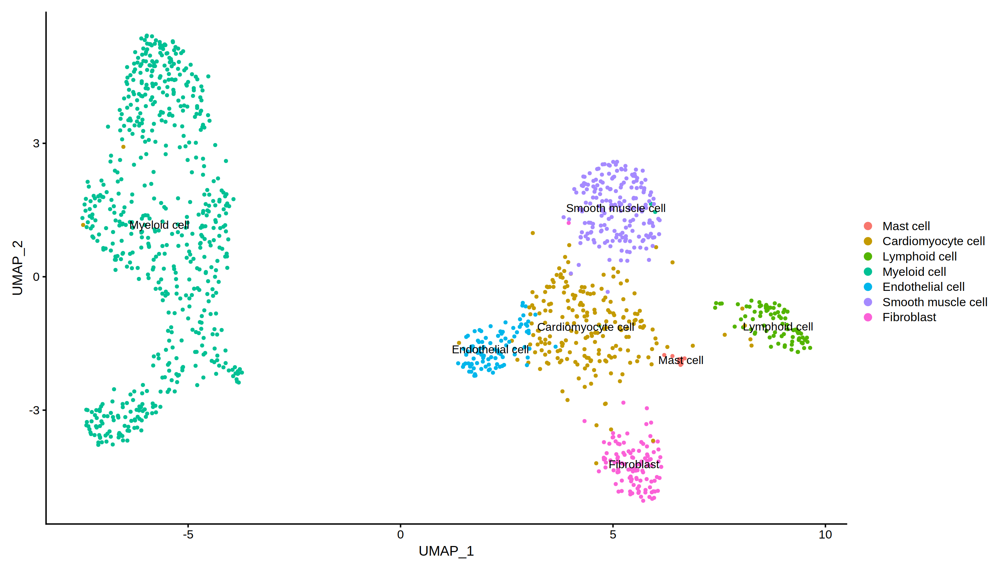

In [68]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",label = T)

In [69]:
dataobj$cell_type <- as.character(Idents(dataobj))
dataobj$cluster.1 <- dataobj$`RNA_snn_res.1`

# Sub.celltype Annotation

### Reannotate Endothelial cell

In [72]:
subobj <- subset(dataobj,cell_type =="Endothelial cell")

In [73]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1603 features requested have not been scaled (running reduction without them): CUX1, WWP1, SYNCRIP, U2SURP, SLAIN2, PTMA, C11orf54, RHOU, SRP14, NDUFS8, LGALS1, PHACTR2, BUB3, PSMG4, IFRD1, MINDY2, GDE1, JUNB, RPL9, FNDC3A, ITGA7, TSG101, DPYD, CBLB, DKK3, CGGBP1, FGL2, SERPINB1, SETD7, RPS3, RPL7, ALAS1, KPNB1, CYP1B1, TRAPPC2B, GAPDH, RPS28, FRS2, CS, SENP6, RBM25, AHI1, SELENON, RAD21, KPNA4, SMTN, H2AJ, RPS13, URI1, M6PR, HSD17B4, VPS28, RPS18, RPS21, GASK1B, ISCA2, ADI1, SETD2, MRPS14, ITPKB, GATC, INPP1, NEAT1, DHRS7, DNM1L, CST3, MBTPS1, RPL3, CTSA, FCN3, MVB12A, TMEM107, NUDT21, RPL41, MIR4458HG, SYT11, SEC61A1, SOAT2, ESAM, TPT1P9, RPS2P46, DDX1, CLIC6, GCLC, NACA, CCN1, SOAT1, PCDH9, SIGLEC1, MRPL39, BHLHE40, SDC2, SKA2, LAMTOR2, TMEM9B, INTS10, ZNF267, ACSL4, RPL39, FNIP2, PELO, NIPBL, PFKFB3, RPL10P16, GPR146, TMEM273, CALM1, LMO2, UBR2, CD63, MDH2, CCN3, DAAM2, RPL29, HSP90B1

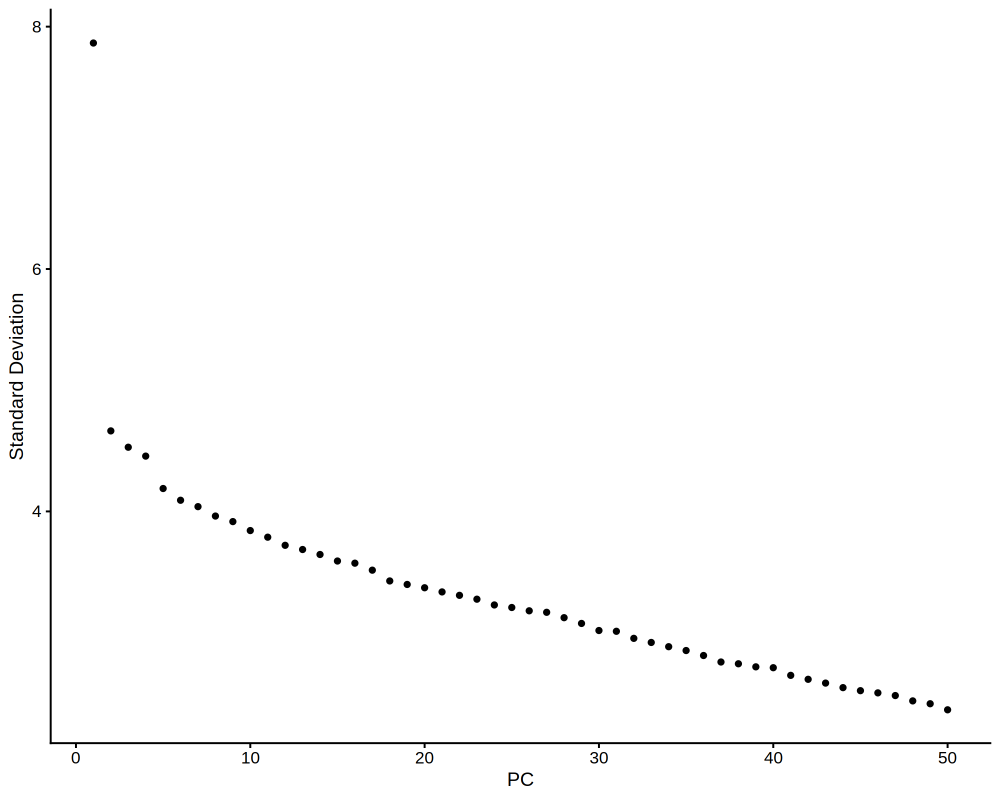

In [75]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))

options(repr.plot.width=10, repr.plot.height=8, repr.plot.res = 200)
ElbowPlot(subobj,ndims=50) 

In [76]:
pcDim = 30

In [77]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

15:27:11 UMAP embedding parameters a = 0.9922 b = 1.112

15:27:11 Read 94 rows and found 30 numeric columns

15:27:11 Using Annoy for neighbor search, n_neighbors = 30

15:27:11 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:27:11 Writing NN index file to temp file /tmp/RtmpOBgVTD/file3ec0f11042cbf8

15:27:11 Searching Annoy index using 1 thread, search_k = 3000

15:27:11 Annoy recall = 100%

15:27:12 Commencing smooth kNN distance calibration using 1 thread

15:27:12 Initializing from normalized Laplacian + noise

15:27:12 Commencing optimization for 500 epochs, with 3638 positive edges

15:27:12 Optimization finished



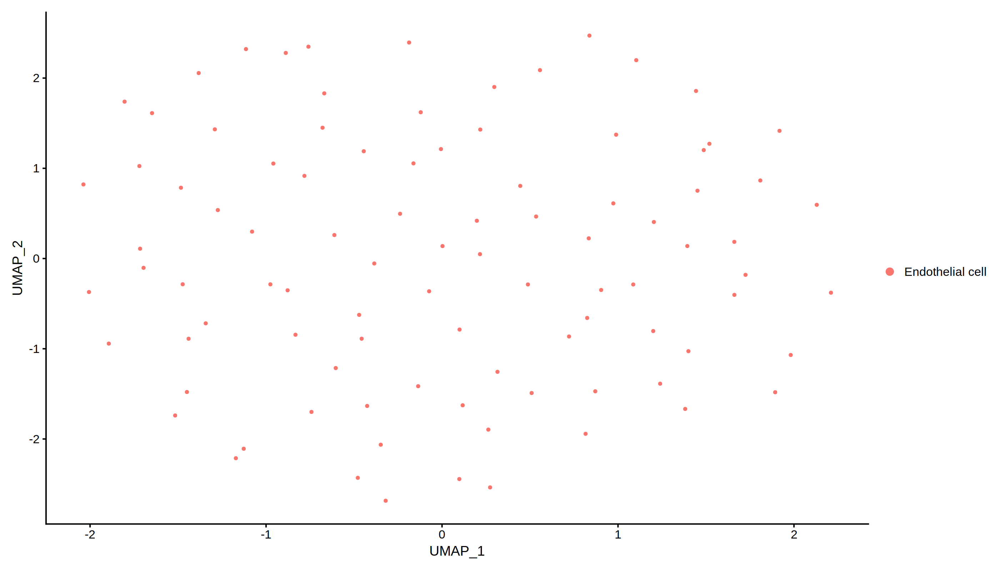

In [78]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj, reduction = "umap")

#### Vascular endothelial cell

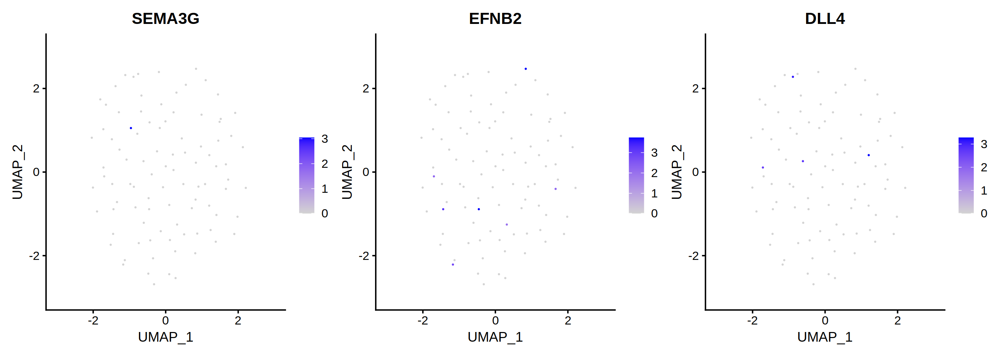

In [79]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=0.1

FeaturePlot(subobj,features = c("SEMA3G","EFNB2","DLL4"),pt.size = pt.size,order = T,ncol=3)

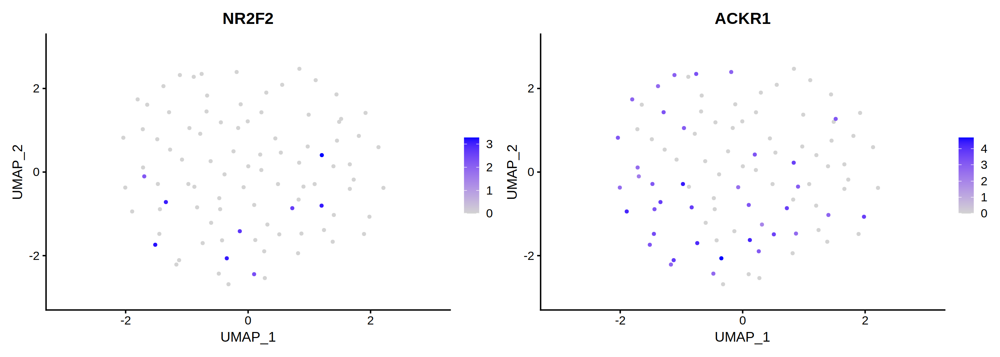

In [80]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("NR2F2","ACKR1"),pt.size = pt.size,order = T,ncol=2)

In [79]:
subobj <- RenameIdents(object = subobj,'4' = 'Vascular endothelial cell','5' = 'Vascular endothelial cell')

#### Endocardial cell

Warning message in FeaturePlot(subobj, features = c("NPR3"), pt.size = pt.size, :
“All cells have the same value (0) of NPR3.”


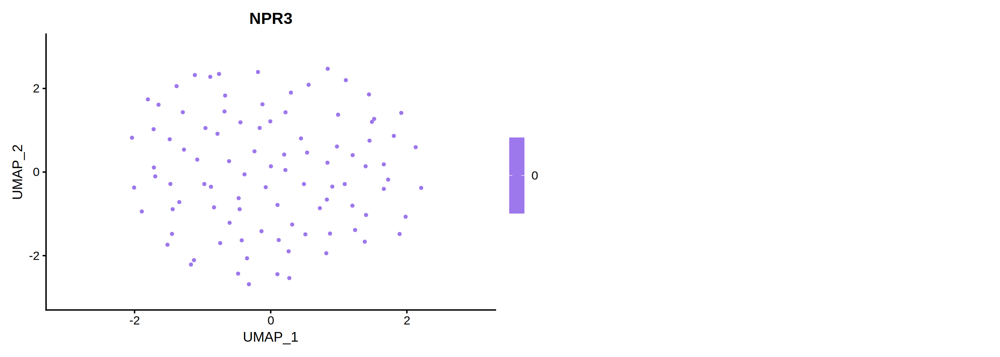

In [81]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("NPR3"),pt.size = pt.size,order = T,ncol=2)

#### Lymphatic endothelial cell

Warning message in FeaturePlot(subobj, features = c("PROX1", "TBX1"), pt.size = pt.size, :
“All cells have the same value (0) of PROX1.”
Warning message in FeaturePlot(subobj, features = c("PROX1", "TBX1"), pt.size = pt.size, :
“All cells have the same value (0) of TBX1.”


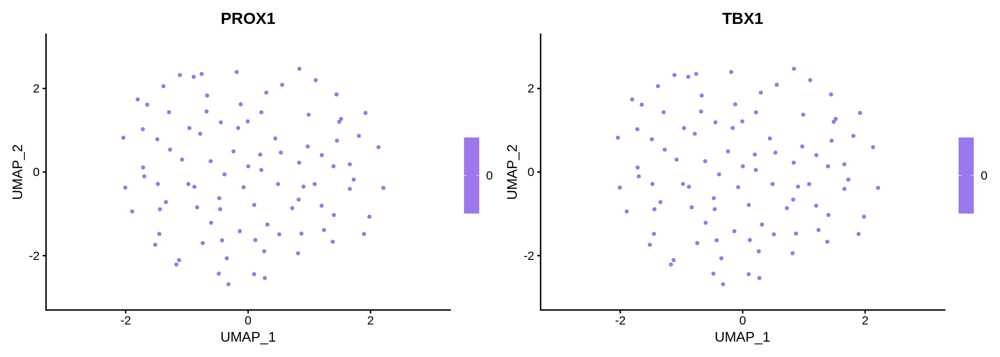

In [82]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("PROX1","TBX1"),pt.size = pt.size,order = T,ncol=2)

#### Capillary endothelial cell

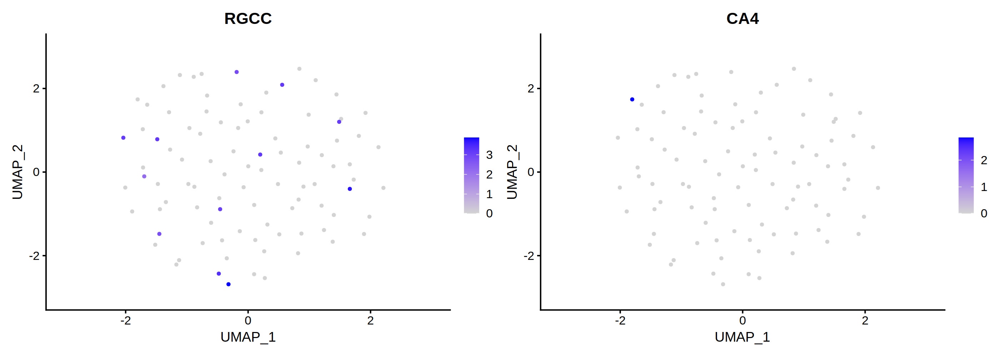

In [83]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("RGCC","CA4"),pt.size = pt.size,order = T,ncol=2)

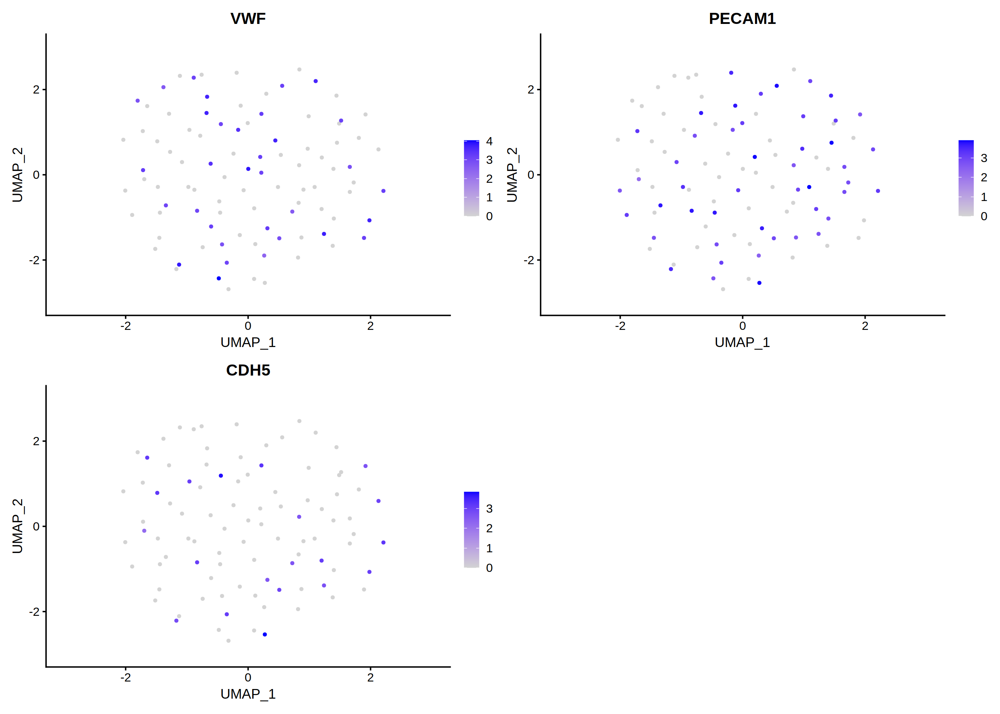

In [84]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("VWF","PECAM1","CDH5"),pt.size = pt.size,order = T,ncol=2)

No finer endothelial subtype 

### Reannotate Fibroblast

In [86]:
subobj <- subset(dataobj,cell_type =="Fibroblast")

In [87]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1554 features requested have not been scaled (running reduction without them): RNF125, ATXN3, BORCS8, ZNF84, GPR34, NEAT1, TOR1A, CD63, PIGG, RHOU, SYT11, SPPL2A, BNIP2, CENPCP1, VCPIP1, METTL23, MT-ND6, HLA-B, SLC33A1, FOXP1, RELA, RPF2, ARFIP1, MSMO1, MTMR2, CCT7, RBM5, ARL2, COPB1, TMEM273, BDH2, RPL41, MAP3K2, S100A11, HLA-DRB1, SERTAD1, RPS28, VTRNA1-1, MYADM, HSP90AA1, ACTG1, C12orf65, GBP4, RPL12, CKM, GAPDH, WDR1, IFI27L2, PHACTR2, ZNF570, RPL8, SNRNP27, OST4, PHB, MAGOH, TRMT6, FAM174C, H2AC6, VEGFA, SLC16A1, AKAP8, NCL, TIMM13, JUNB, RPS6, CCDC152, TMEM123, PCNA, ILF2, GUSB, WDR45B, RPL3, SNAPIN, DPCD, TRAPPC2L, APOL6, TUBA4A, GTF2B, LIMA1, KAT2B, TNRC6B, PTRH2, LAP3, TMBIM6, TMA7, STRADB, ATL3, EIF2S2, GPBP1L1, FXR1, YWHAG, XPNPEP1, PPIL2, ATP2B4, HSPA5, ELP6, TXN2, NOL8, LHFPL2, ZC3HAV1, HDAC7, SGMS2, CFL1, VCL, MTRF1L, FAM204A, LDHA, VRK1, JRKL, NKAP, NLRP6, MTF2, MAGOHB, SNW

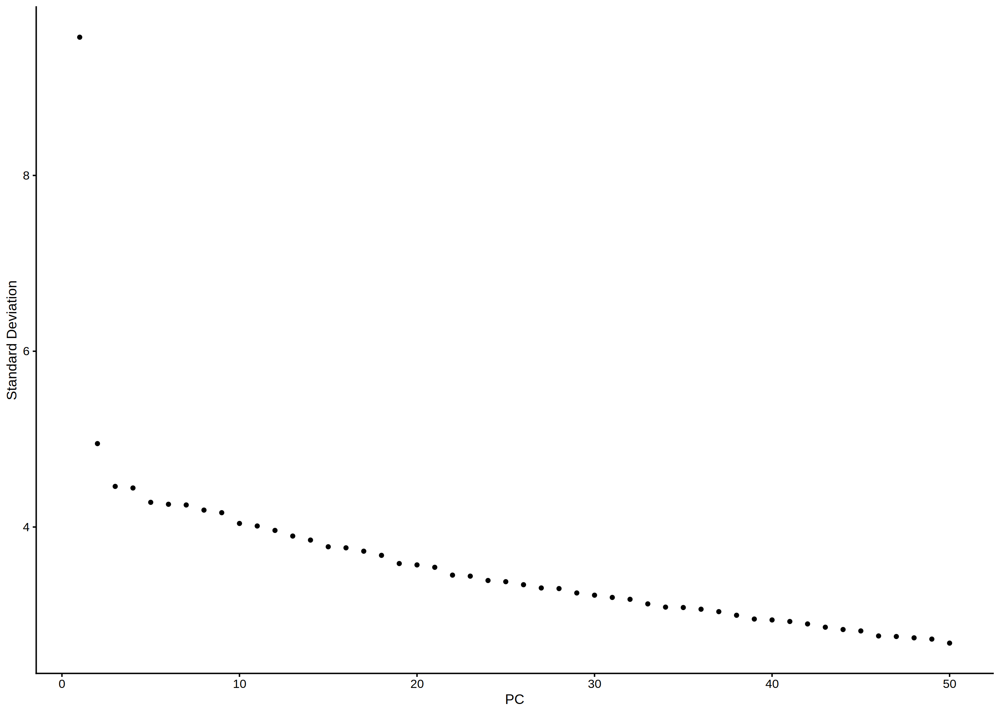

In [88]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [89]:
pcDim = 30

In [90]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

15:29:59 UMAP embedding parameters a = 0.9922 b = 1.112

15:29:59 Read 110 rows and found 30 numeric columns

15:29:59 Using Annoy for neighbor search, n_neighbors = 30

15:29:59 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:29:59 Writing NN index file to temp file /tmp/RtmpOBgVTD/file3ec0f1398033fa

15:29:59 Searching Annoy index using 1 thread, search_k = 3000

15:29:59 Annoy recall = 100%

15:30:00 Commencing smooth kNN distance calibration using 1 thread

15:30:00 Initializing from normalized Laplacian + noise

15:30:00 Commencing optimization for 500 epochs, with 4198 positive edges

15:30:00 Optimization finished



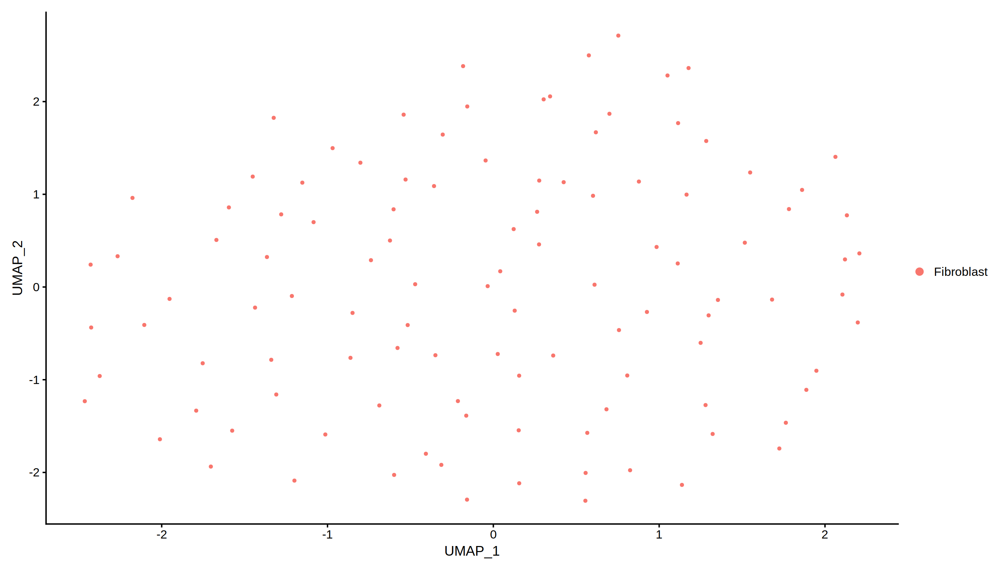

In [91]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj, reduction = "umap")

#### Myofibroblast

Warning message in FeaturePlot(subobj, c("CTHRC1", "ACTA2", "POSTN", "ADAM12")):
“All cells have the same value (0) of CTHRC1.”
Warning message in FeaturePlot(subobj, c("CTHRC1", "ACTA2", "POSTN", "ADAM12")):
“All cells have the same value (0) of ADAM12.”


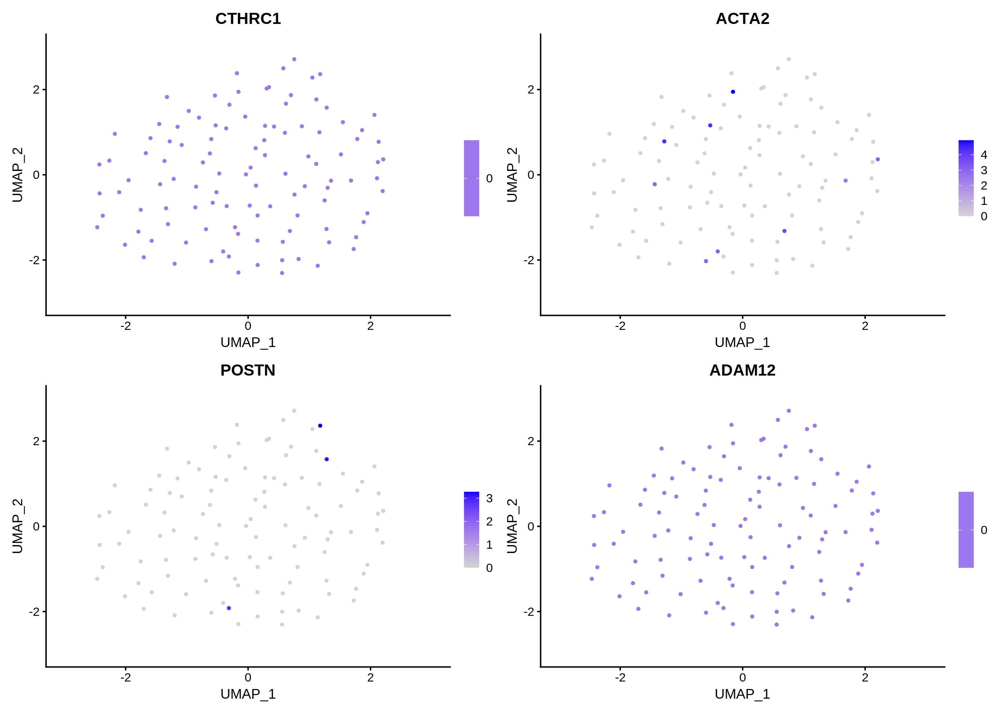

In [92]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("CTHRC1","ACTA2","POSTN","ADAM12"))


#### Fibrocyte

Warning message in FeaturePlot(subobj, c("CCR2", "CXCR4")):
“All cells have the same value (0) of CCR2.”


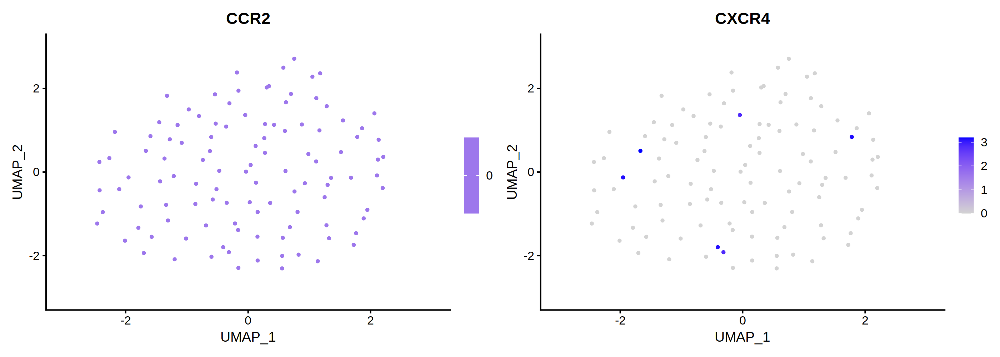

In [93]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
FeaturePlot(subobj,c("CCR2","CXCR4"))

#### Basement membrane fibroblast

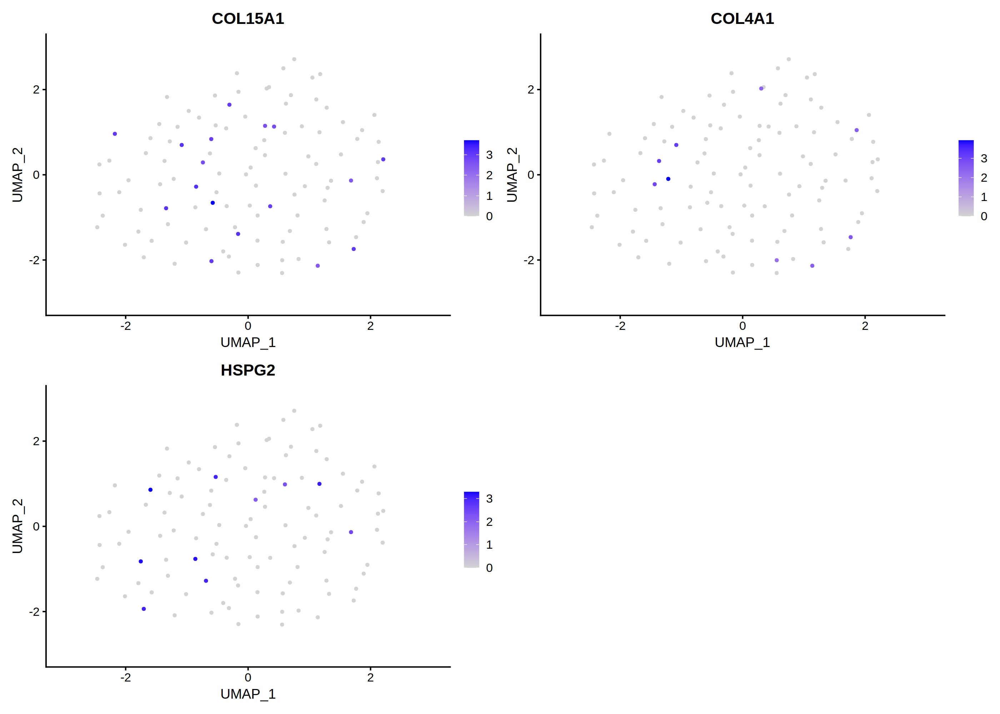

In [94]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("COL15A1","COL4A1","HSPG2"))


#### Adventitial fibroblast

Warning message in FeaturePlot(subobj, c("PI16", "DPP4", "LY6H")):
“All cells have the same value (0) of DPP4.”
Warning message in FeaturePlot(subobj, c("PI16", "DPP4", "LY6H")):
“All cells have the same value (0) of LY6H.”


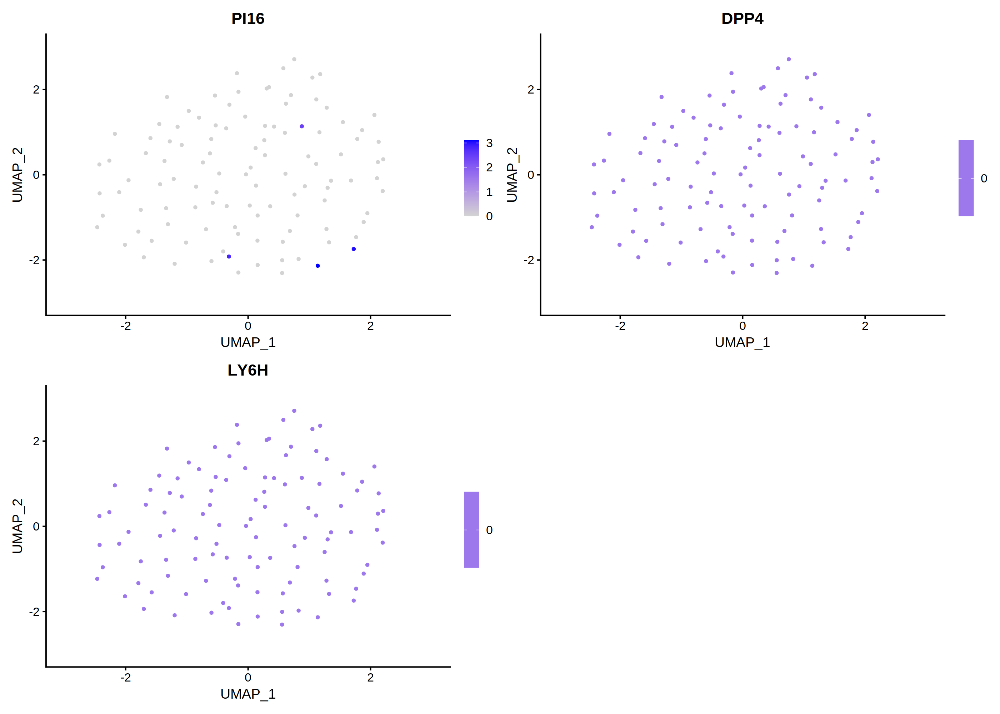

In [96]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("PI16","DPP4","LY6H"))

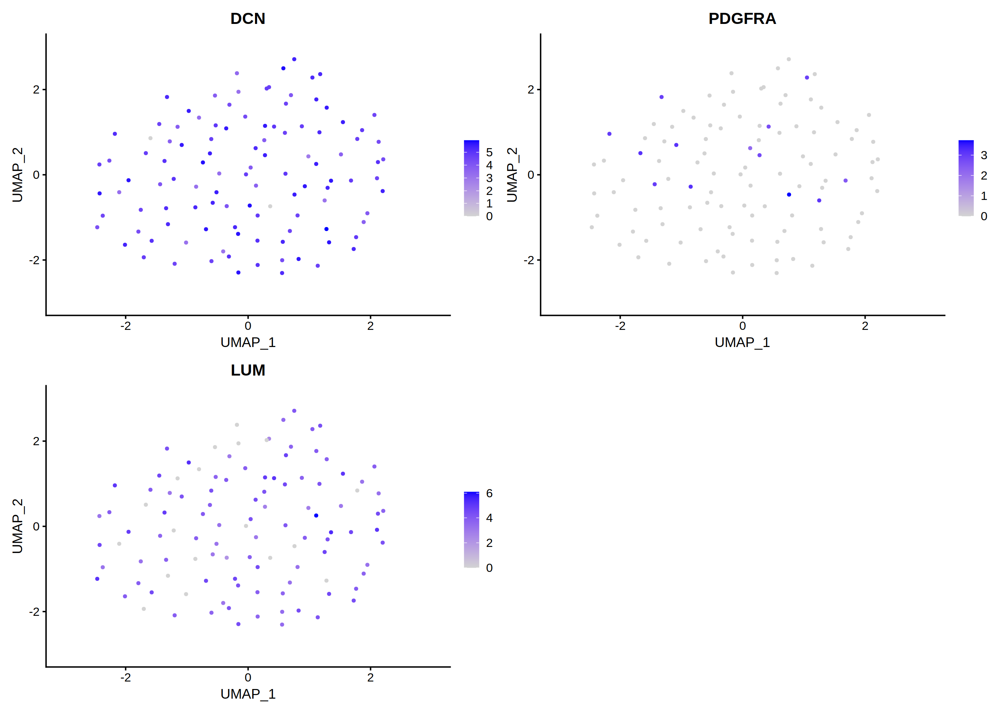

In [99]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("DCN","PDGFRA","LUM"))

No finer fibroblast subtype 

### Reannotate Myeloid cell

In [100]:
subobj <- subset(dataobj,cell_type =="Myeloid cell")

In [101]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1117 features requested have not been scaled (running reduction without them): MTERF2, CHPF, HAUS3, H3C10, MIR210HG, TMEM131L, PDZD2, PABPC1L, HYI, PLA1A, L1CAM, TRMT1L, RASSF9, CLDN5, RPL31P49, ZNF511, MTARC2, CDKN2AIPNL, TRIB2, ZNF689, SNX16, NIFK-AS1, FOXC2, C4BPB, ST3GAL3, STAG3L2, OBSL1, CFI, TMEM42, ACOT8, ZNF565, ZNF470, TIGIT, IL3RA, TAF4, AP2A1, CD3G, VTRNA1-3, TMEM183A, ZNF761, FUT8, ITPR3, DCAF8, IFITM2, RERG, CD7, SDSL, MCAT, TMEM91, IGFBP3, TIMD4, PCSK5, TTC28, POLR3C, SHROOM1, TASOR, SPIN4, DNAJC30, ATP8B5P, TOR2A, PDE1C, RUNX2, ST7L, ZNF865, CEP83, STK36, HSP90AA1, TOP3A, CFL2, GIMAP7, ANGPT2, CDC42BPA, ZNF44, TMEM168, UTY, ADAMTS5, GLI4, ZNF141, RNF24, CTSF, HOMEZ, SLC17A9, INTS12, LAIR2, RRP7A, OSR2, SUPT20H, A2M, ETV1, HSPA2, TCF20, BRD1, UGGT2, ADCY9, CENPJ, ZFAND4, TXNDC16, DUSP4, THOC5, IL12A, RANBP10, RUFY2, SHARPIN, KTI12, POGLUT3, SLC25A40, CDC14A, MAU2, DCPS, NADK

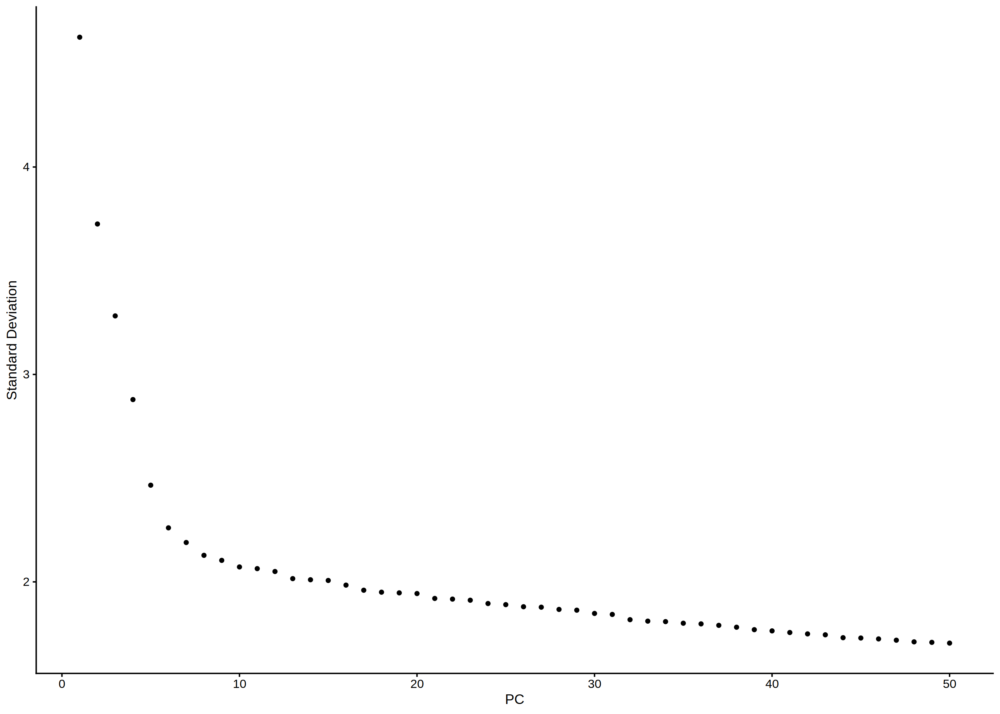

In [102]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [103]:
pcDim = 30

In [104]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

15:31:40 UMAP embedding parameters a = 0.9922 b = 1.112

15:31:40 Read 616 rows and found 30 numeric columns

15:31:40 Using Annoy for neighbor search, n_neighbors = 30

15:31:40 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:31:40 Writing NN index file to temp file /tmp/RtmpOBgVTD/file3ec0f1f0797b4

15:31:40 Searching Annoy index using 1 thread, search_k = 3000

15:31:40 Annoy recall = 100%

15:31:40 Commencing smooth kNN distance calibration using 1 thread

15:31:41 Initializing from normalized Laplacian + noise

15:31:41 Commencing optimization for 500 epochs, with 25610 positive edges

15:31:42 Optimization finished



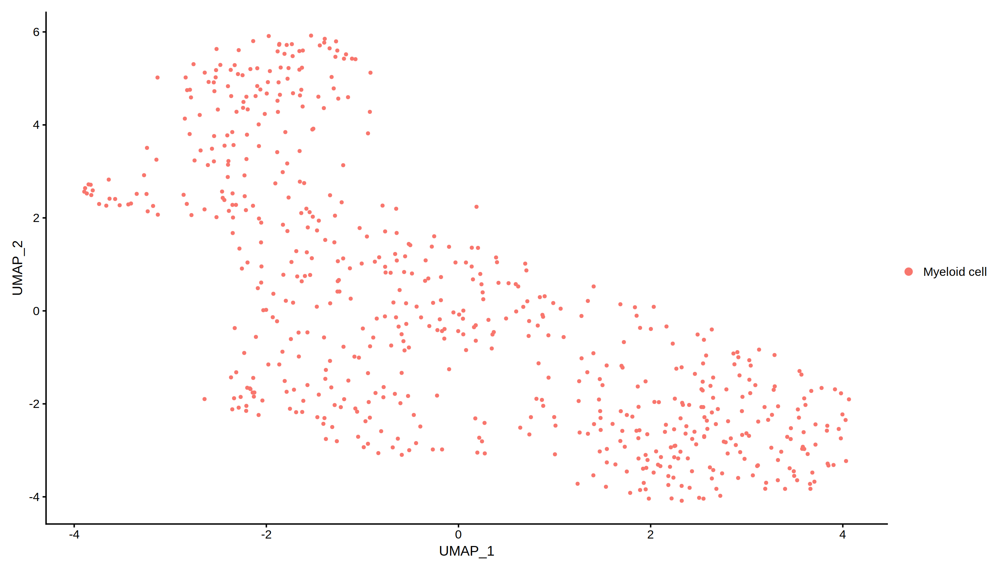

In [105]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj, reduction = "umap")

In [164]:
# Cluster the cells
subobj <- FindNeighbors(subobj, reduction = "pca", dims = 1:pcDim, nn.eps = 0.5)
subobj <- FindClusters(subobj, resolution =1.5, n.start = 2)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 616
Number of edges: 34008

Running Louvain algorithm...
Maximum modularity in 2 random starts: 0.4837
Number of communities: 6
Elapsed time: 0 seconds


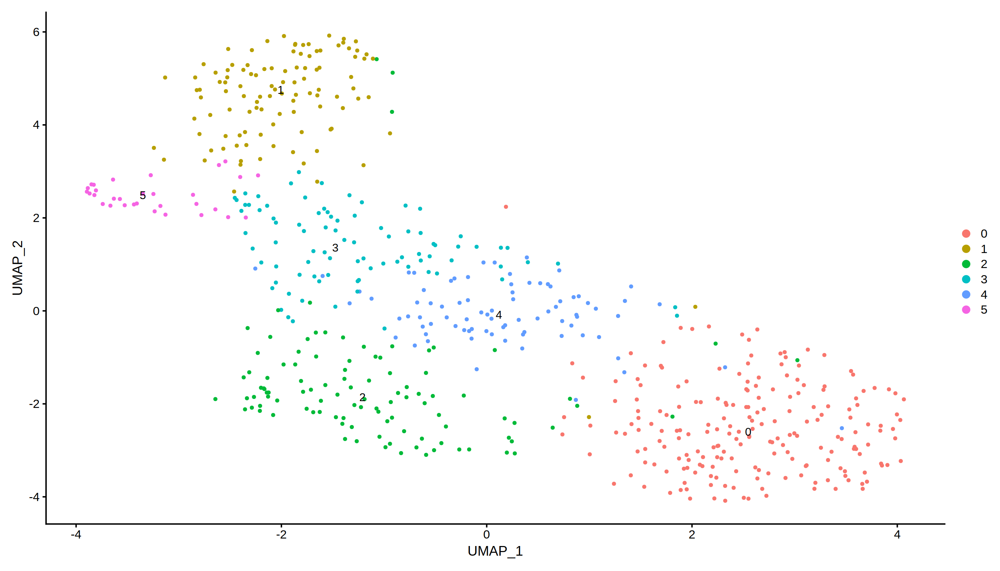

In [165]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

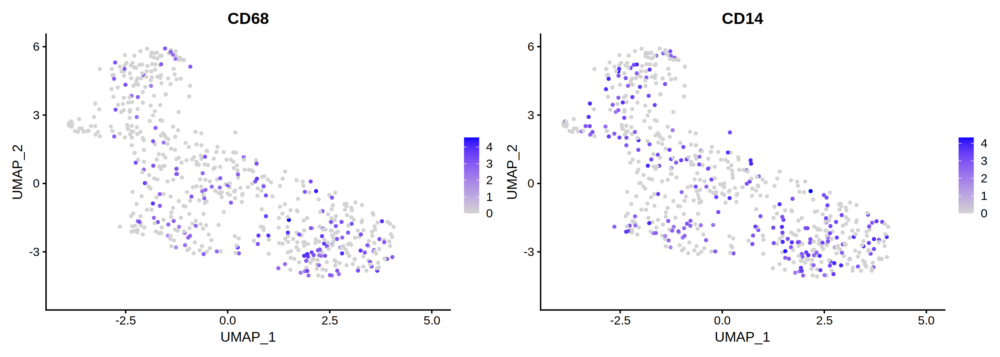

In [166]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("CD68","CD14"))

#### Neutrophilic granulocyte

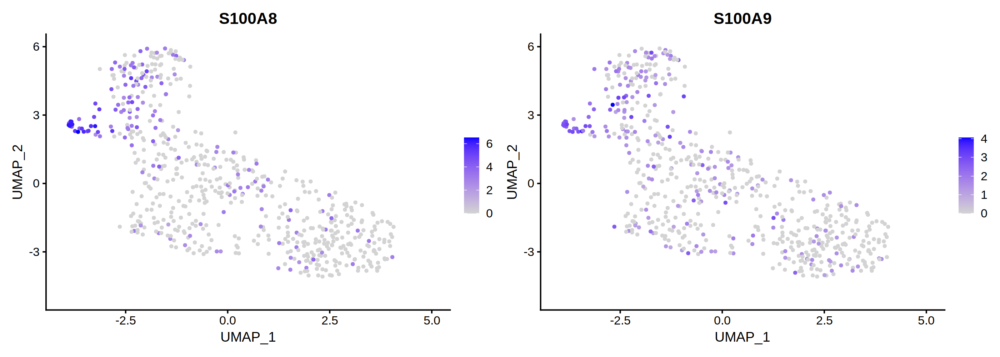

In [146]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("S100A8","S100A9"))


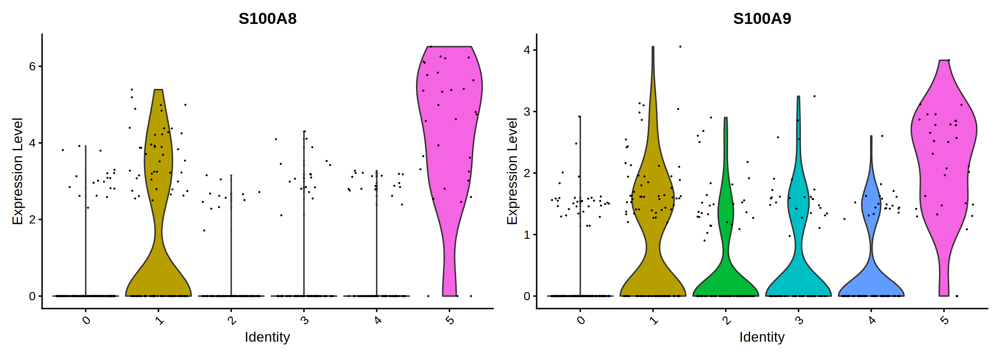

In [167]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
VlnPlot(subobj,c("S100A8","S100A9"))


In [175]:
subobj <- RenameIdents(object = subobj,'5' = 'Neutrophilic granulocyte')

#### Mast cell

Warning message in FeaturePlot(subobj, c("MS4A2", "CPA3", "TPSAB1")):
“All cells have the same value (0) of CPA3.”


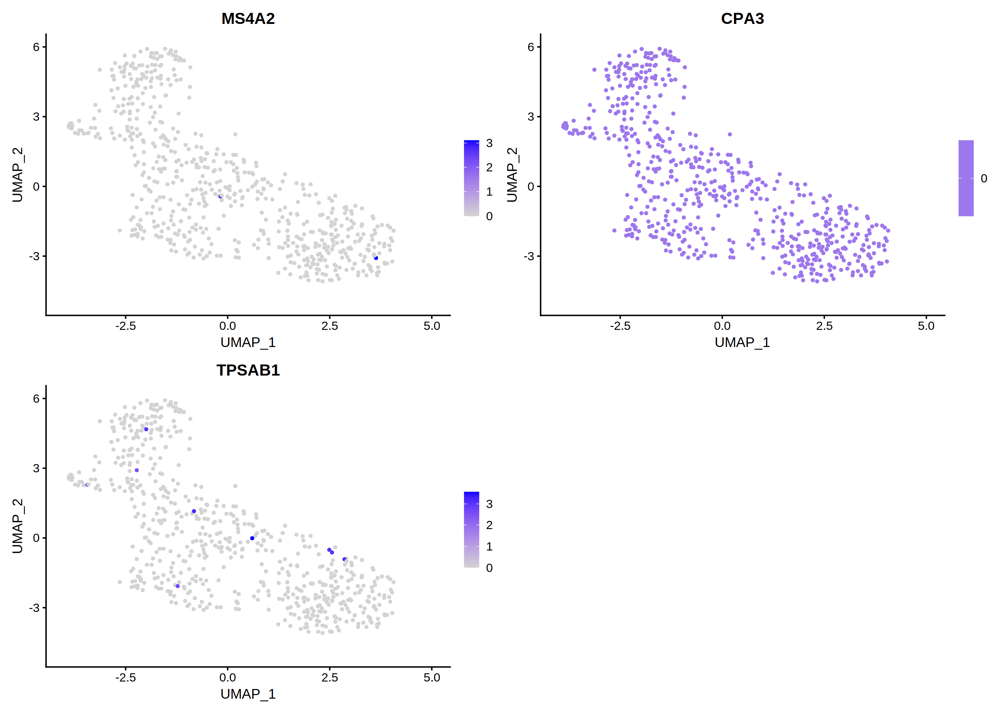

In [149]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("MS4A2","CPA3","TPSAB1"))


### Dendritic cell

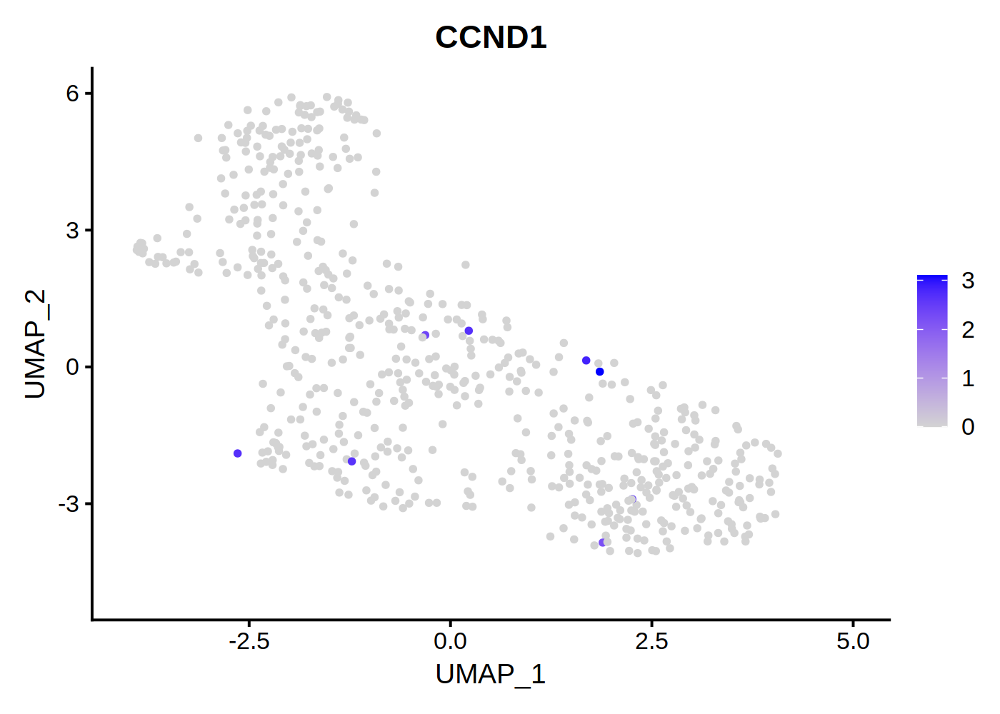

In [150]:
options(repr.plot.width=7, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("CCND1"))


### Macrophage

Warning message in FeaturePlot(subobj, c("PLAC8", "MSR1", "MRC1", "CD163", "RBPJ", :
“All cells have the same value (0) of PLAC8.”


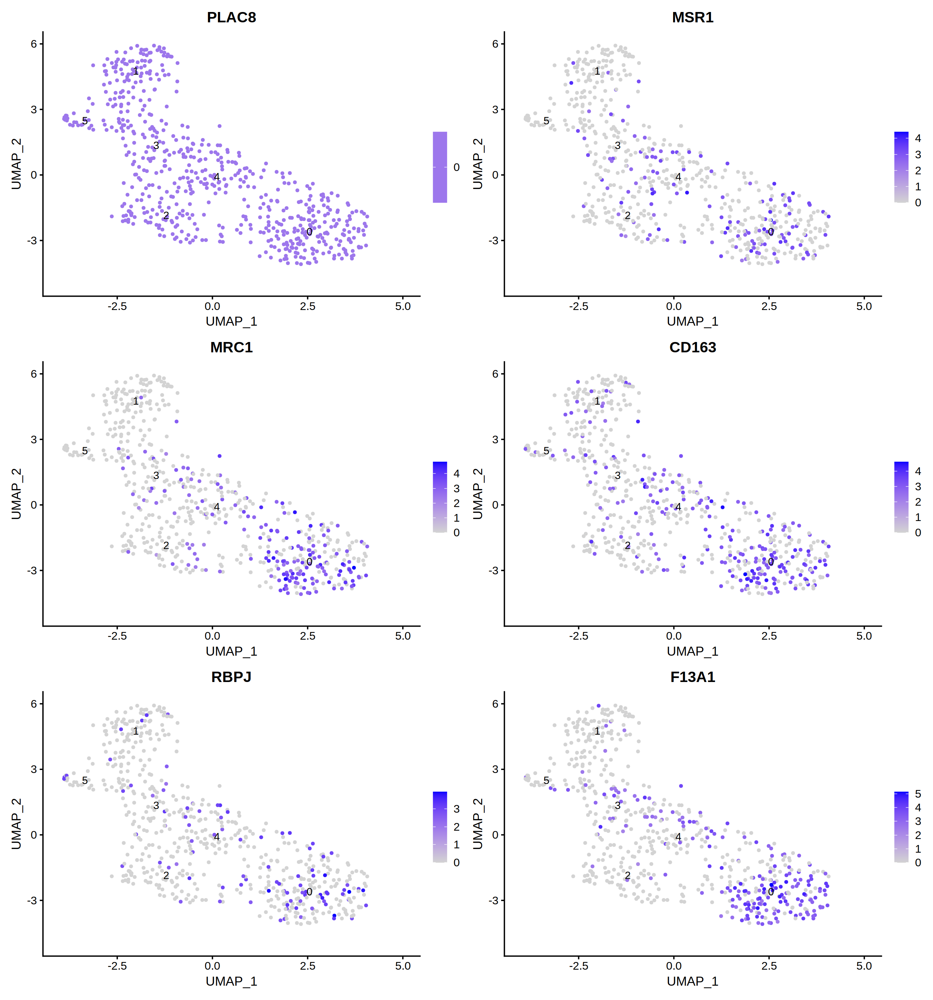

In [168]:
options(repr.plot.width=14, repr.plot.height=5*3, repr.plot.res = 200)
FeaturePlot(subobj,c("PLAC8","MSR1","MRC1","CD163","RBPJ","F13A1"),label=T)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of PLAC8.”


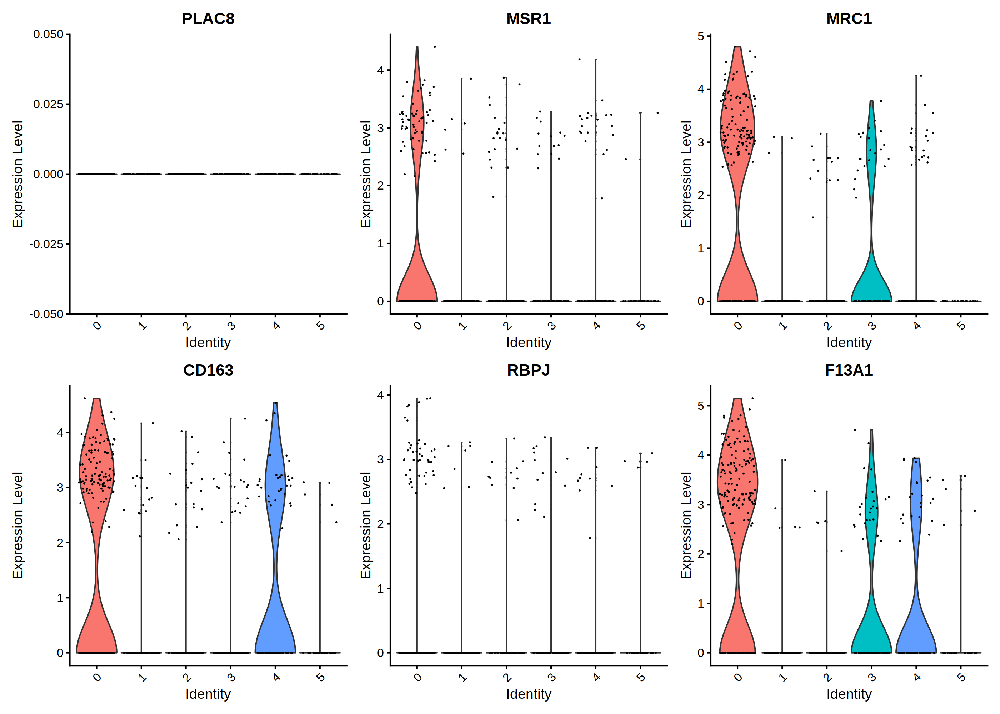

In [169]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
VlnPlot(subobj,c("PLAC8","MSR1","MRC1","CD163","RBPJ","F13A1"))


In [170]:
subobj <- RenameIdents(object = subobj,'0' = 'Macrophage','3' = 'Macrophage','4' = 'Macrophage')

In [177]:
subobj <- RenameIdents(object = subobj,'2' = 'Macrophage')

### Monocyte

Warning message in FeaturePlot(subobj, c("CD14", "FCGR3A", "PLAC8"), label = T):
“All cells have the same value (0) of PLAC8.”


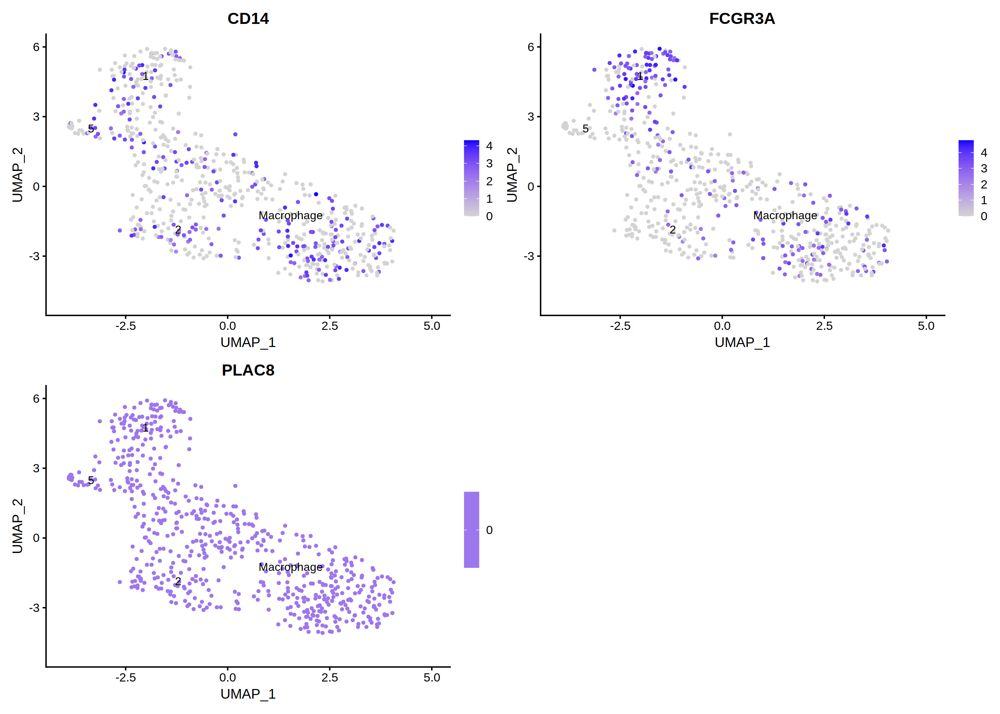

In [171]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("CD14","FCGR3A","PLAC8"),label = T)


Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of PLAC8.”


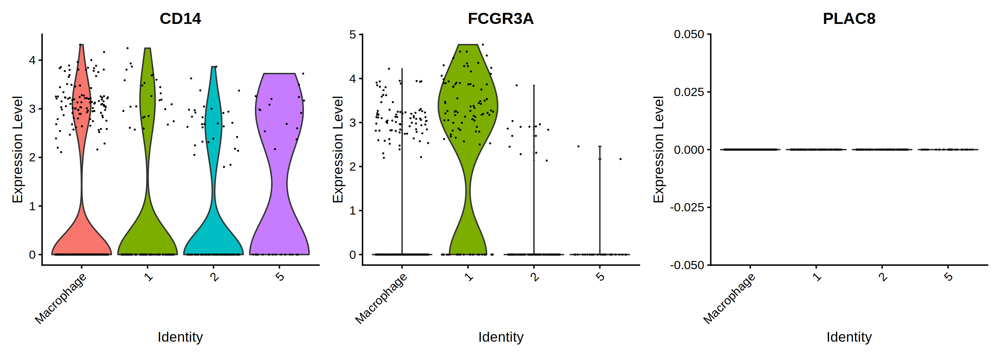

In [172]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
VlnPlot(subobj,c("CD14","FCGR3A","PLAC8"))


In [173]:
subobj <- RenameIdents(object = subobj,'1' = 'Monocyte')

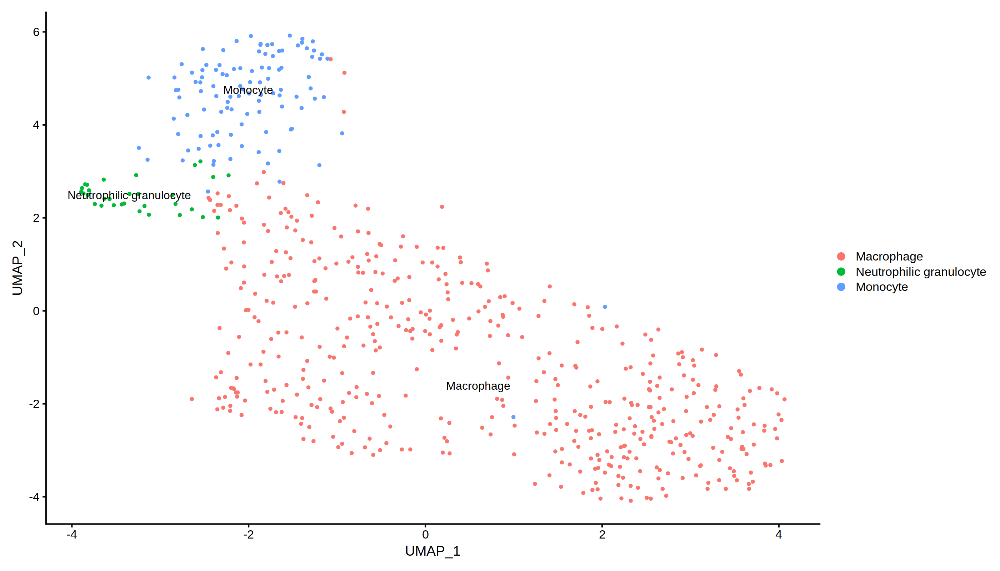

In [178]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

In [180]:
dataobj$sub.cell_type <- dataobj$cell_type

In [181]:
# save the subtypes
dataobj$sub.cell_type[colnames(dataobj) %in% colnames(subobj)] <- as.character(Idents(subobj))

In [182]:
dataobj$`cluster.2` <- ""
dataobj$`cluster.2`[colnames(dataobj) %in% colnames(subobj)] <- subobj$`RNA_snn_res.1.5`

### Reannotate Lymphoid cell

In [183]:
subobj <- subset(dataobj,cell_type =="Lymphoid cell")

In [184]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1609 features requested have not been scaled (running reduction without them): PPP1R12A, SLC20A1, RAB13, TPPP3, DNTTIP2, CHD1, NADSYN1, MIR24-2, HMGB1, SMARCA5, GSAP, ARPC2, NDUFC1, DPH3, MECP2, CMC1, PGD, TIMM10, IRF2BP2, H1-0, TOB1, EIF3K, MCTS1, BLMH, GGPS1, BABAM1, FAM107A, RPL9, LYRM4, MIR29B2CHG, CHCHD10, SSR4, FHL1, RPL23, BBX, SAR1B, CD3G, MALAT1, PTPN2, NBDY, IFIT3, MRPS35, GPX1, PAFAH1B1, GPX4, POLDIP3, RPS17, COX7A2, ANXA7, FAIM2, BET1L, CLDND1, HSPD1, XBP1P1, STAM2, CD44, SCN7A, PLPP5, LPCAT3, ATP5MG, OTUB1, LGALS8, KRT10, BOD1L1, PPIG, IDH3G, FLI1, PLAGL1, TMC8, DLEU2, COX20, DDHD1, CD81, ATP5F1A, FAM32A, SCP2, CLK4, PIAS1, MESD, ILF3-DT, RNF115, RPS20, STARD7, GCC2, IPO7, COL4A1, HLA-C, UBL5, COLGALT1, RCBTB2, AKR1A1, UCHL3, IL10RA, RAP1B, PCAT19, COG5, OARD1, NUP42, ACOT13, MRPL21, ARPC1A, TTYH3, CST3, SYNGR1, CELF1, CLEC2B, CIR1, PPP2R3C, RANBP2, TMSB4XP4, PSME2, ACSL1, PF

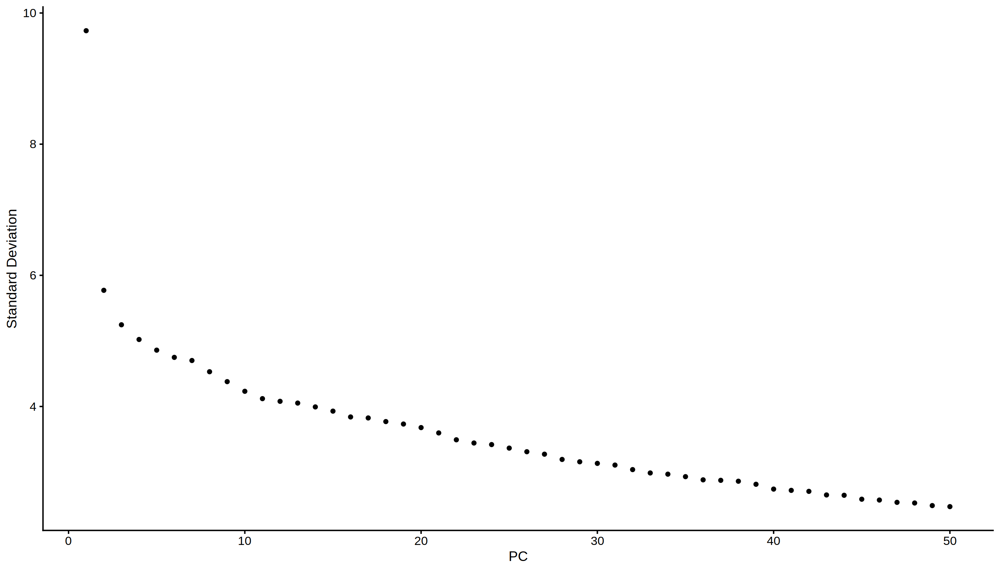

In [185]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [186]:
pcDim = 30

In [187]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

16:11:17 UMAP embedding parameters a = 0.9922 b = 1.112

16:11:17 Read 81 rows and found 30 numeric columns

16:11:17 Using Annoy for neighbor search, n_neighbors = 30

16:11:17 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:11:17 Writing NN index file to temp file /tmp/RtmpOBgVTD/file3ec0f134d32b4c

16:11:17 Searching Annoy index using 1 thread, search_k = 3000

16:11:17 Annoy recall = 100%

16:11:17 Commencing smooth kNN distance calibration using 1 thread

16:11:18 Initializing from normalized Laplacian + noise

16:11:18 Commencing optimization for 500 epochs, with 3030 positive edges

16:11:18 Optimization finished



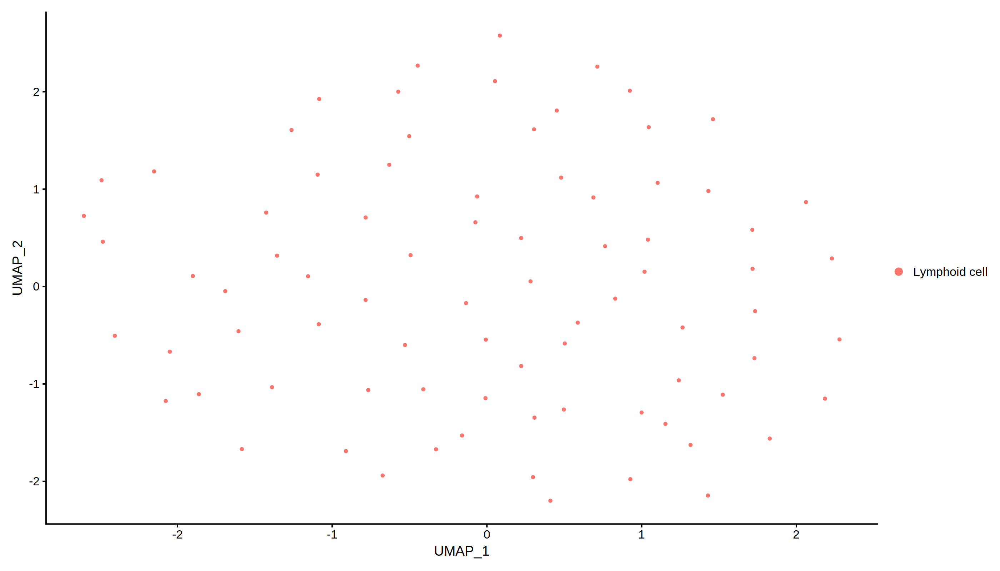

In [188]:
DimPlot(subobj, reduction = "umap")

Warning message in FeaturePlot(subobj, c("CD79A", "CD24")):
“All cells have the same value (0) of CD24.”


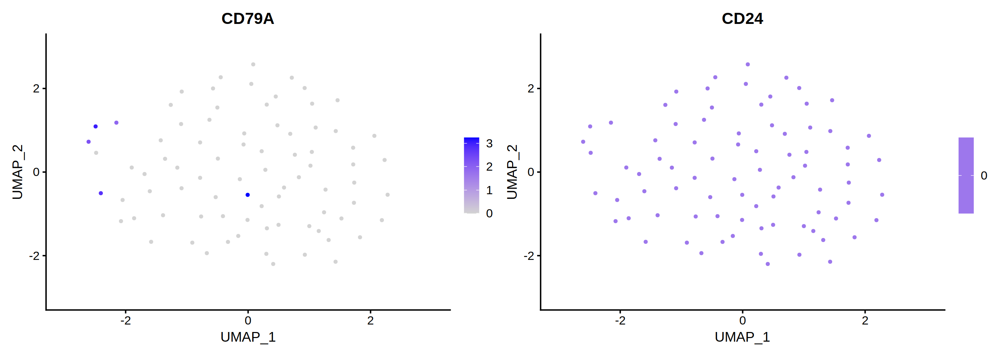

In [189]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("CD79A","CD24"))

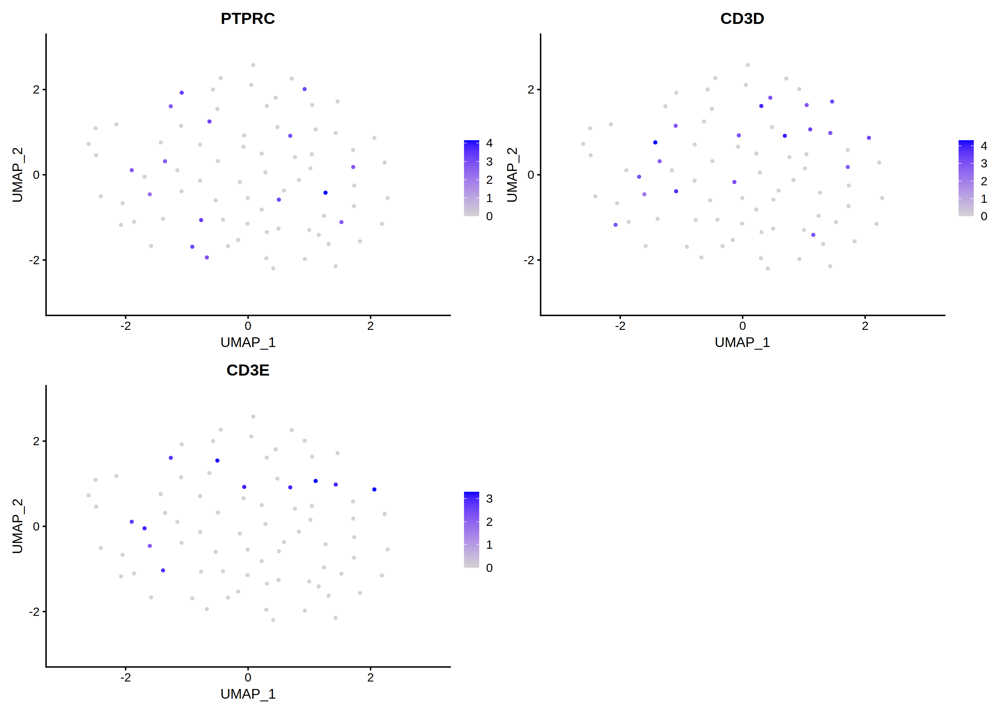

In [190]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("PTPRC","CD3D","CD3E"))

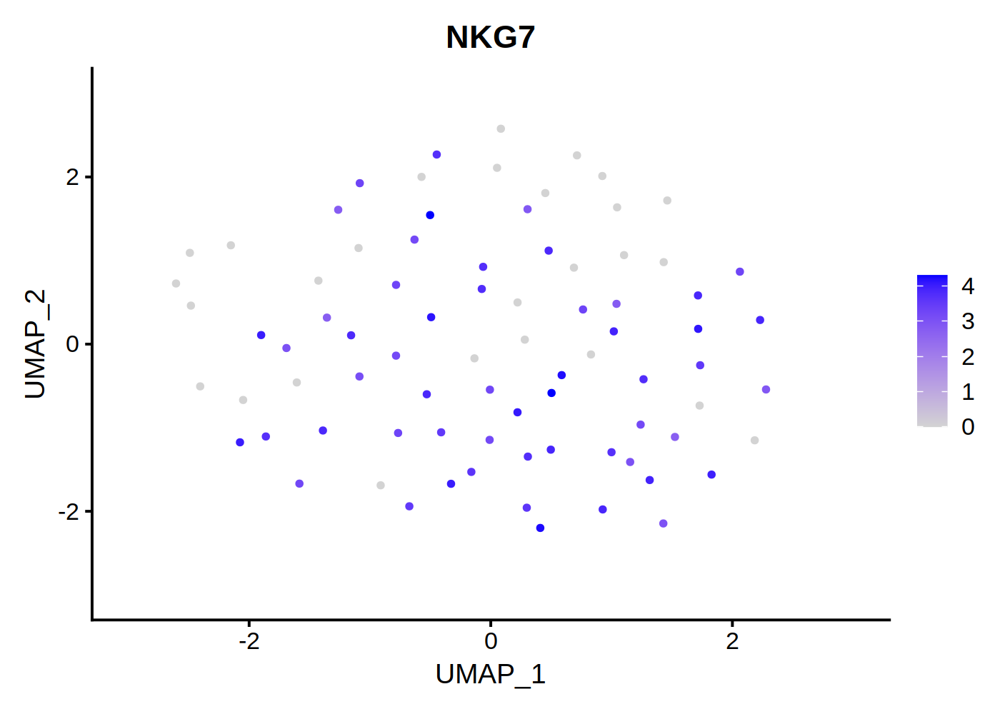

In [191]:
options(repr.plot.width=7, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("NKG7"))

In [192]:
# save the subtypes
dataobj$sub.cell_type[colnames(dataobj) %in% colnames(subobj)] <- "NK cell"

# Recheck all

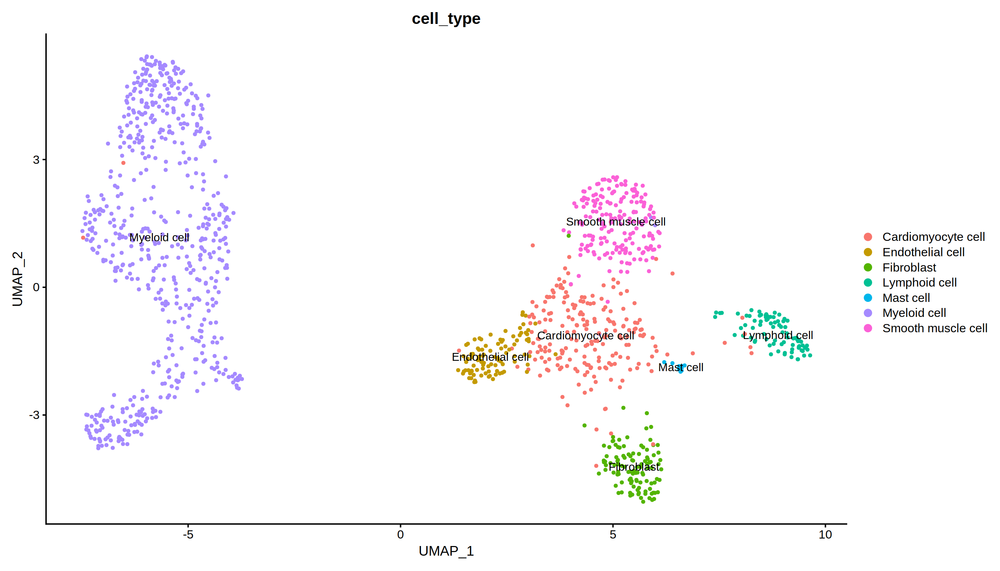

In [193]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",group.by = "cell_type",label = T)

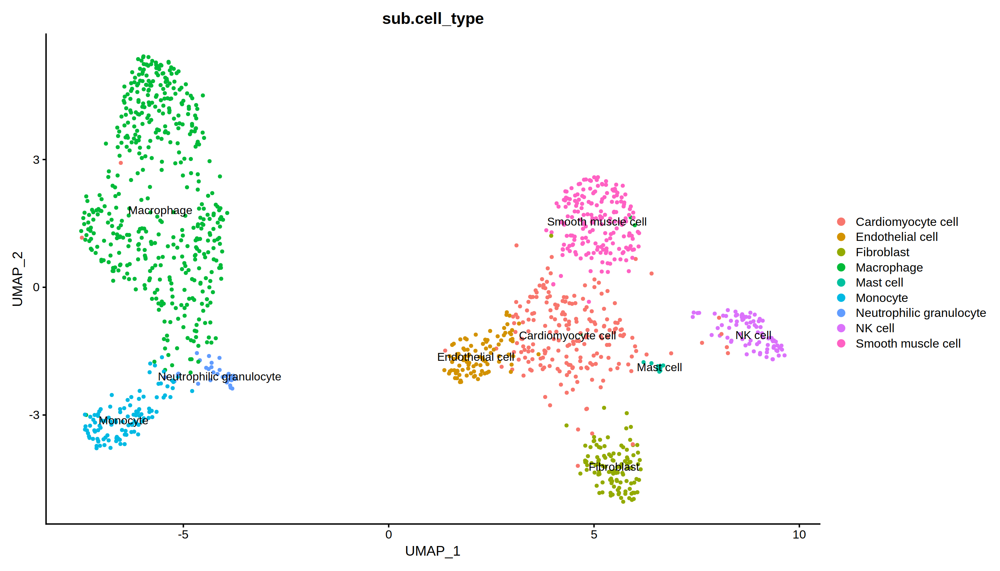

In [194]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",group.by = "sub.cell_type",label = T)

# reorganize metadata

In [196]:
dataobj$seurat_cluster <- paste0(dataobj$`cluster.1`,".",dataobj$`cluster.2`)

In [197]:
unique(dataobj$seurat_cluster)

[1] "7.2" "0.3" "8."  "3."  "1.1" "4."  "5."  "0.4" "7.4" "0.5" "7.6" "2." 
[13] "9."  "6.2" "0.1" "1.5" "0.2" "1.3"

In [198]:
colnames(dataobj@meta.data)

[1] "user_id"         "study_id"        "cell_id"         "organ"          
 [5] "region"          "subregion"       "seq_tech"        "sample_status"  
 [9] "donor_id"        "donor_gender"    "donor_age"       "original_name"  
[13] "cell_type"       "RNA_snn_res.0.8" "seurat_clusters" "RNA_snn_res.1"  
[17] "cluster.1"       "sub.cell_type"   "cluster.2"       "seurat_cluster"

In [199]:
colnames(dataobj@meta.data) <- c('user_id', 'study_id', 'cell_ID', 'organ', 'region', 'subregion', 'seq_tech', 'sample_status', 'donor_ID', 'donor_gender', 'donor_age', 'original_name', 'main.cell_type', 'RNA_snn_res.0.8', 'seurat_clusters', 'RNA_snn_res.1', 'cluster.1', 'cell_type', 'cluster.2', 'seurat_cluster')

In [200]:
dataobj@meta.data <- dataobj@meta.data[,c('cell_ID', 'donor_ID', 'donor_gender', 'donor_age',  'original_name', 'organ', 'region', 'subregion', 'sample_status', 'seq_tech',"cell_type","seurat_cluster")]

In [202]:
dataobj$if_patient <- "No"
dataobj$donor_status <- "Healthy"
dataobj$treatment <- "None"
dataobj$ethnicity <- "Asian"

In [203]:
dataobj@meta.data

,cell_ID,donor_ID,donor_gender,donor_age,original_name,organ,region,subregion,sample_status,seq_tech,cell_type,seurat_cluster,if_patient,donor_status,treatment,ethnicity
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AdultHeart_1.AAAACGAAAACGTAGAGA,AdultHeart_1.AAAACGAAAACGTAGAGA,AdultHeart1_52Y,Male,52yr,M1 Macrophage,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Monocyte,7.2,No,Healthy,None,Asian
AdultHeart_1.AAAACGTTCCGCCCATCT,AdultHeart_1.AAAACGTTCCGCCCATCT,AdultHeart1_52Y,Male,52yr,Macrophage,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Macrophage,0.3,No,Healthy,None,Asian
AdultHeart_1.AAAGTTCACAAGTAGAGA,AdultHeart_1.AAAGTTCACAAGTAGAGA,AdultHeart1_52Y,Male,52yr,T cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,NK cell,8.,No,Healthy,None,Asian
AdultHeart_1.AACCTAAGGACTGTCGGT,AdultHeart_1.AACCTAAGGACTGTCGGT,AdultHeart1_52Y,Male,52yr,Macrophage,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Macrophage,0.3,No,Healthy,None,Asian
AdultHeart_1.AACCTAATACAGTGAAGC,AdultHeart_1.AACCTAATACAGTGAAGC,AdultHeart1_52Y,Male,52yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,3.,No,Healthy,None,Asian
AdultHeart_1.AACCTAATCTCTCATGAT,AdultHeart_1.AACCTAATCTCTCATGAT,AdultHeart1_52Y,Male,52yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,3.,No,Healthy,None,Asian
AdultHeart_1.AACCTACCAGACTATTGT,AdultHeart_1.AACCTACCAGACTATTGT,AdultHeart1_52Y,Male,52yr,M2 Macrophage,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Macrophage,1.1,No,Healthy,None,Asian
AdultHeart_1.AACCTACCATCTAGCGAG,AdultHeart_1.AACCTACCATCTAGCGAG,AdultHeart1_52Y,Male,52yr,Fibroblast,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Fibroblast,4.,No,Healthy,None,Asian
AdultHeart_1.AACCTACCGCTAGTCCCG,AdultHeart_1.AACCTACCGCTAGTCCCG,AdultHeart1_52Y,Male,52yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,3.,No,Healthy,None,Asian


In [204]:
saveRDS(dataobj,"/data1/chenyx/Compitition/processed/HCL_A1.rds")

In [1]:
dataobj <- readRDS("/data1/chenyx/Compitition/processed/HCL_A1.rds")

In [6]:
dataobj@meta.data$Ref <- "10.1038/s41586-020-2157-4"
dataobj@meta.data$organ <- "Heart"

In [10]:
MCT <- dataobj$cell_type
MCT[dataobj$cell_type %in% c('Monocyte', 'Macrophage','Mast cell', 'Neutrophilic granulocyte')] <- "Myeloid cell"
MCT[dataobj$cell_type %in% c('NK cell')] <- "Lymphoid cell"
dataobj$MCT <- MCT

In [12]:
dataobj$develop_stage <- "Adult"

In [13]:
dataobj@meta.data

,cell_ID,donor_ID,donor_gender,donor_age,original_name,organ,region,subregion,sample_status,seq_tech,cell_type,seurat_cluster,if_patient,donor_status,treatment,ethnicity,Ref,MCT,develop_stage
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AdultHeart_1.AAAACGAAAACGTAGAGA,AdultHeart_1.AAAACGAAAACGTAGAGA,AdultHeart1_52Y,Male,52yr,M1 Macrophage,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Monocyte,7.2,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Myeloid cell,Adult
AdultHeart_1.AAAACGTTCCGCCCATCT,AdultHeart_1.AAAACGTTCCGCCCATCT,AdultHeart1_52Y,Male,52yr,Macrophage,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Macrophage,0.3,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Myeloid cell,Adult
AdultHeart_1.AAAGTTCACAAGTAGAGA,AdultHeart_1.AAAGTTCACAAGTAGAGA,AdultHeart1_52Y,Male,52yr,T cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,NK cell,8.,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Lymphoid cell,Adult
AdultHeart_1.AACCTAAGGACTGTCGGT,AdultHeart_1.AACCTAAGGACTGTCGGT,AdultHeart1_52Y,Male,52yr,Macrophage,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Macrophage,0.3,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Myeloid cell,Adult
AdultHeart_1.AACCTAATACAGTGAAGC,AdultHeart_1.AACCTAATACAGTGAAGC,AdultHeart1_52Y,Male,52yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,3.,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Smooth muscle cell,Adult
AdultHeart_1.AACCTAATCTCTCATGAT,AdultHeart_1.AACCTAATCTCTCATGAT,AdultHeart1_52Y,Male,52yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,3.,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Smooth muscle cell,Adult
AdultHeart_1.AACCTACCAGACTATTGT,AdultHeart_1.AACCTACCAGACTATTGT,AdultHeart1_52Y,Male,52yr,M2 Macrophage,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Macrophage,1.1,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Myeloid cell,Adult
AdultHeart_1.AACCTACCATCTAGCGAG,AdultHeart_1.AACCTACCATCTAGCGAG,AdultHeart1_52Y,Male,52yr,Fibroblast,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Fibroblast,4.,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Fibroblast,Adult
AdultHeart_1.AACCTACCGCTAGTCCCG,AdultHeart_1.AACCTACCGCTAGTCCCG,AdultHeart1_52Y,Male,52yr,Smooth muscle cell,Heart,Ventricle,Left ventricle,Healthy,Microwell-seq,Smooth muscle cell,3.,No,Healthy,None,Asian,10.1038/s41586-020-2157-4,Smooth muscle cell,Adult


In [14]:
saveRDS(dataobj,"/data1/chenyx/Compitition/processed/HCL_A1.rds")